# Traffic Incidents in Calgary

    Connor Woods, Amy Zhao, Khizer Kamran, and Joshua Fisher

Every year Calgarians are injured while driving their vehicle on dangerous road and highway conditions, and as a result, also incur multiple financial penalties. These costs can accumulate and may include refilling fuel, replacing seasonal tires, paying for car maintenance, and insurance price increases. More so with the ongoing pandemic, it is becoming increasingly more imperative that the physical and financial wellbeing of Calgarians be prioritized. 

Most of us will get behind the wheel of a car at some point in our lives, and as students at the U of C (and therefore Calgary residents!) it’s good practice to be informed of the safe and dangerous driving times/conditions in our city. Determining the significant influencing factors in Calgary’s traffic incidents will not only aid in travel time loss, but also in protecting the livelihood of ourselves and our community. We hope that the insights gained from this report will aide you in future driving decisions, and save you time, money, and bodily harm.

<br>

# Guiding Questions

Each section of the report attempts to answer a guiding question, and the report is structured in the same order as the questions below.
<br>


    [1] Which days of the week are safest/more dangerous? How about months? When are the safest/most dangerous times to drive?

    [2] Has the number of traffic incidents changed since the start of the COVID pandemic?

    [3] What types of incidents are most frequent, and when? Which types last longest?

    [4] How does weather affect the number of observed accidents?


# Datasets


Structurally, each dataset we have is in a tabular form and can be categorized as structured data (formatted into MS Excel tables, containing cell data formatting, and does not include audio-visual or multimedia data types) (City of Calgary, 2022) The datasets were publicly made available to us through open government licensing access from both the Government of Alberta and the City of Calgary. This access grants us to make copies, modifications, adapt, update, or publish as our directive as long as the project analysis remains within the confines of ethical and legal boundaries (City of Calgary, 2022).
<br>
<br>
Street traffic incidents provide all of the necessary variables, coordinates, and counts of each major car accident that has occurred in Calgary from 2016 to 2022 (City of Calgary, 2022). Street traffic incident data contains ten columns of different variables set across twenty-nine thousand, nine hundred and three rows (10 x 29903) in which the columns consist of: the information pertaining to the street in which the incident occurred (text), the actual description of what had transpired on that particular street (text), starting and modified date times to indicate the date and time of the incidence (date and time formatting), the quadrant in Calgary in which the incident took place (text), longitudinal and latitudinal coordinates for location (decimal), count of each instance of each specific incidence (whole number formatting), the incidence ID to identify each unique incident (mixed number, date and time, decimal formatting), and the point category to organize each set of latitudinal as well as longitudinal coordinate points into the format POINT(Longitude, Latitude) (City of Calgary, 2022).
<br>
<br>
Traffic Counts at permanent stations contains necessary vehicle counts with associated timestamps, to approximate traffic volume on Calgary's roads. For loading simplicity, data was split for 2021, and 2020, to be able to handle the large files. Both volume data sets contain 7 columns, while 2020 has 1466325 rows, and 2021 has 1360510 rows (City of Calgary, 2022). Columns contain the address of the counting station (text), the direction of traffic travel (text), ID number of the counting segment (whole number formatting), the study date (date and time formatting), the study ID (whole number formatting), the volume (whole number formatting), and the ID of the observed count (mixed number, dat,e and time formatting) (City of Calgary, 2022).
<br>
<br>
Calgary weather data from 2020 to 2021 contains the environmental data variables that illustrate weather patterns in the city with respect to dates where traffic volume or traffic incidents were more prevalent (Government of Alberta, 2022). The weather data contains thirty-three columns set across approximately seven hundred, thirty-two rows (33 x 732), specifically consisting of: longitude and latitude (in decimal formatting), station name of where the weather pattern was reported (text formatting), date and time of the reported weather (date and time formatting), quality of the data (text formatting), maximum temperatures with associated flags (°C and text formatting respectively), minimum temperatures with associated flags (°C and text formatting respectively), average or mean temperatures with associated flags (°C and numerical formatting), heat deg days with associated flags (°C and numerical formatting), cool deg days with associated flags (°C and numerical formatting), total rain with associated flags (mm and text formatting), total snow with associated flags (cm and text formatting), total precipitation with associated flags (mm and text formatting), snow on ground with associated flags (cm and text formatting respectively), direction of maximum gust with associated flag (10s degrees and text formatting respectively), speed of maximum gust with associated flags (km/h and text formatting respectively) (Government of Alberta, 2022). 
<br>
<br>
Some challenges in working with the datasets arose from string manipulation, and datetime formatting. In traffic incidents, some rows were missing quadrant values, but the end of the street name in the first column always contained that relevant info. The issue was that some street names ended with a " " (space character), so it was slightly tedious to work around that. With the traffic dataset, to visualize certain months, weekdays, and hours, careful separation, adjustment, and rejoining of data was performed, as will be seen below.


# Section 1:

The following section is by Connor Woods

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

    Data set wrangling and cleaning (Traffic Incidents, Traffic counts at permanent stations):

In [2]:
dft = pd.read_csv('Traffic_Incidents.csv')
dft = dft.loc[(dft.START_DT > "2017") & (dft.START_DT < "2022")]

# I will focus on 2017 to 2021 inclusive. Result is a removal of 621 rows

# functions to be called later.
func = lambda x: pd.to_datetime(x, format="%Y-%m-%d %H:%M").weekday() 
func2 = lambda x: pd.to_datetime(x, format="%Y-%m-%d %H:%M").time().hour
func3 = lambda x: pd.to_datetime(x, format="%Y-%m-%d %H:%M").month
func4 = lambda x: pd.to_datetime(x, format="%Y-%m-%d %H:%M").year

# Create a years subset data frame.
years_df = dft.rename(columns = {"START_DT":"Year"})
years_df = years_df["Year"].apply(func4)


# create a months subset data frame.
months_df = dft.rename(columns = {"START_DT":"Month"})
months_df = months_df["Month"].apply(func3)


# create a day subset data frame (day of the week: 0=monday, 1=tuesday, .... 6=sunday).
weekday_df = dft.rename(columns = {"START_DT":"Day"})
weekday_df = weekday_df["Day"].apply(func)


# create a hour subset data frame.
hours_df = dft.rename(columns = {"START_DT":"Hour"})
hours_df = hours_df["Hour"].apply(func2)


# join and sort our subset data frames. I replaced numerical values for month and weekday to reflect a string value of each day/month (loops at end of this cell).
# keep a copy of our traffic data, as traffic_data1, for use later when calculating numerical totals.
traffic_data1 = pd.concat([years_df, months_df, weekday_df, hours_df], axis=1)
traffic_data = traffic_data1.sort_values(by=['Year', 'Month', 'Day', 'Hour'])
months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

display(traffic_data)

for i in range(7):
    traffic_data["Day"] = traffic_data["Day"].replace(i, days[i])

for j in range(13):
    traffic_data["Month"] = traffic_data["Month"].replace(j, months[j-1])

display(traffic_data)

,Year,Month,Day,Hour
7661,2017,2,0,0
10820,2017,2,0,6
12600,2017,2,0,6
28168,2017,2,0,6
6956,2017,2,0,7
...,...,...,...,...
14886,2021,12,6,21
12401,2021,12,6,22
17073,2021,12,6,22
17458,2021,12,6,22


,Year,Month,Day,Hour
7661,2017,Feb,Monday,0
10820,2017,Feb,Monday,6
12600,2017,Feb,Monday,6
28168,2017,Feb,Monday,6
6956,2017,Feb,Monday,7
...,...,...,...,...
14886,2021,Dec,Sunday,21
12401,2021,Dec,Sunday,22
17073,2021,Dec,Sunday,22
17458,2021,Dec,Sunday,22


    Traffic Volume dataset wrangling.
    A note about our traffic volumes: they do NOT include residential volumes, only main road ways: Crowchild, glenmore, deerfoot, stoney, mcknight, 16th ave, sarcee, mcleod, and more.
    Volumes presented here are likely slightly lower than the true volumes.

In [3]:
traffic_vol_2021 = pd.read_csv('Traffic_Counts_at_Permanent_stations_2021.csv')

# wrangling our volume dataset for 2021.

func5 = lambda x: pd.to_datetime(x, format="%m/%d/%Y %I:%M:%S %p") if x.name == "STUDY_DATE" else x
func6 = lambda x: x.time().hour
func7 = lambda x: x.weekday()
func8 = lambda x: x.month

# set our study date column to datetime type.
traffic_vol_2021 = traffic_vol_2021.apply(func5)
vol = traffic_vol_2021["VOLUME"]

# create 3 subset data frames below: one for hour of volume count, day, and month. combine these below, like in the original dataset.
traffic_vol_hr = traffic_vol_2021.rename(columns = {"STUDY_DATE":"Hour"})
traffic_vol_hr = traffic_vol_hr["Hour"]
traffic_vol_hr = traffic_vol_hr.apply(func6)

traffic_vol_day = traffic_vol_2021.rename(columns = {"STUDY_DATE":"Day"})
traffic_vol_day = traffic_vol_day["Day"]
traffic_vol_day = traffic_vol_day.apply(func7)

traffic_vol_month = traffic_vol_2021.rename(columns = {"STUDY_DATE":"Month"})
traffic_vol_month = traffic_vol_month["Month"]
traffic_vol_month = traffic_vol_month.apply(func8)
print("done")

done


In [4]:
volume_2021 = pd.concat([vol, traffic_vol_month, traffic_vol_day, traffic_vol_hr], axis=1)
print(volume_2021)

         VOLUME  Month  Day  Hour
0            32      1    4     0
1            33      1    4     0
2            41      1    4     0
3            56      1    4     0
4           132      1    4     0
...         ...    ...  ...   ...
1360467       5     12    4    23
1360468       1     12    4    23
1360469     168     12    4    23
1360470       7     12    4    23
1360471       3     12    4    23

[1360472 rows x 4 columns]


In [5]:
# calculate volumes per hour, weekday, and month. loop and summate volumes. 
# I've choosen to divide by a constant, 13500, to get smaller numbers for simplicity sake.
# we will use these lists later on in graphical representation.
hourly_vol_2021 = []
weekday_vol_2021 = []
monthly_vol_2021 = []

# months range from 1-12 thus i loop in range 13, and skip i = 0.
# days and hours are easier, as they range 0-6, and 0-23.
for i in range(13):
    if i > 0:
        x = volume_2021.loc[(volume_2021.Month == i)]
        monthly_vol_2021.append((x["VOLUME"].sum())/13500)
    
for i in range(7):
    x = volume_2021.loc[(volume_2021.Day == i)]
    weekday_vol_2021.append((x["VOLUME"].sum())/13500)
    
for i in range(24):
    x = volume_2021.loc[(volume_2021.Hour == i)]
    hourly_vol_2021.append((x["VOLUME"].sum())/13500)
    
print(hourly_vol_2021)
print(weekday_vol_2021)
print(monthly_vol_2021)

[63.71051851851852, 38.88088888888889, 28.837333333333333, 25.92577777777778, 38.38103703703704, 107.21844444444444, 277.31348148148146, 438.5011851851852, 486.94348148148146, 441.34155555555554, 476.2126666666667, 535.4517777777778, 583.6471851851852, 596.6516296296296, 647.4821481481481, 708.3629629629629, 711.4163703703704, 623.522, 478.7983703703704, 361.8052592592593, 281.0099259259259, 217.67362962962963, 166.60844444444444, 118.20607407407407]
[1262.346, 1304.6485925925926, 1308.9216296296297, 1298.5177037037038, 1360.4886666666666, 1049.640962962963, 869.3385925925926]
[1201.9776296296295, 1008.1432592592593, 1198.4688888888888, 741.5702962962963, 1024.2038518518518, 795.6897037037037, 101.20585185185185, 0.0, 0.0, 0.0, 852.0062222222223, 1530.6364444444444]


In [6]:
traffic_vol_2020 = pd.read_csv('Traffic_Counts_at_Permanent_Stations_2020.csv')
# wrangling our volume dataset for 2020. Same process as 2021 dataset.

traffic_vol_2020 = traffic_vol_2020.apply(func5)
vol = traffic_vol_2020["VOLUME"]

traffic_vol_hr = traffic_vol_2020.rename(columns = {"STUDY_DATE":"Hour"})
traffic_vol_hr = traffic_vol_hr["Hour"]
traffic_vol_hr = traffic_vol_hr.apply(func6)

traffic_vol_day = traffic_vol_2020.rename(columns = {"STUDY_DATE":"Day"})
traffic_vol_day = traffic_vol_day["Day"]
traffic_vol_day = traffic_vol_day.apply(func7)

traffic_vol_month = traffic_vol_2020.rename(columns = {"STUDY_DATE":"Month"})
traffic_vol_month = traffic_vol_month["Month"]
traffic_vol_month = traffic_vol_month.apply(func8)
print("done")

done


In [7]:
volume_2020 = pd.concat([vol, traffic_vol_month, traffic_vol_day, traffic_vol_hr], axis=1)
print(volume_2020)

         VOLUME  Month  Day  Hour
0            28      1    2     0
1            41      1    2     0
2            77      1    2     0
3           122      1    2     0
4           151      1    2     0
...         ...    ...  ...   ...
1466320       4      1    4     0
1466321       2      1    4     0
1466322     156      1    4     0
1466323       6      1    4     0
1466324       6      1    4     0

[1466325 rows x 4 columns]


In [8]:
# summating volumes for 2020. same as 2021 dataset.
hourly_vol_2020 = []
weekday_vol_2020 = []
monthly_vol_2020 = []

for i in range(13):
    if i > 0:
        x = volume_2020.loc[(volume_2020.Month == i)]
        monthly_vol_2020.append((x["VOLUME"].sum())/13500)
    
for i in range(7):
    x = volume_2020.loc[(volume_2020.Day == i)]
    weekday_vol_2020.append((x["VOLUME"].sum())/13500)
    
for i in range(24):
    x = volume_2020.loc[(volume_2020.Hour == i)]
    hourly_vol_2020.append((x["VOLUME"].sum())/13500)
    
print(hourly_vol_2020)
print(weekday_vol_2020)
print(monthly_vol_2020)

[131.21162962962964, 81.46955555555556, 59.598962962962965, 53.87096296296296, 74.22881481481481, 209.64844444444444, 555.1734814814815, 824.8699259259259, 857.9255555555555, 799.1653333333334, 860.717037037037, 965.846962962963, 1055.3298518518518, 1085.3514074074074, 1165.0646666666667, 1280.1474814814815, 1306.6135555555556, 1152.6241481481482, 894.8792592592592, 686.1465185185185, 551.0726666666667, 439.22066666666666, 330.18837037037036, 230.0828888888889]
[2257.7140740740742, 2398.561925925926, 2439.3236296296295, 2492.2365925925924, 2491.6513333333332, 1944.0795555555555, 1626.881037037037]
[1786.303037037037, 1758.0385925925925, 1408.4212592592592, 954.3390370370371, 1242.5637037037036, 1333.2897777777778, 1473.3591851851852, 1133.1646666666666, 1465.1293333333333, 848.7985925925926, 1015.4071111111111, 1231.633851851852]


# Data exploration, and visualization:

    Initialize dataframes that represent each year of traffic incident data.
    You are invited to change the year and explore incidents from 2017 to 2021 inclusive in the graphing code that will follow.

In [9]:
traffic_data_2017 = traffic_data.loc[(traffic_data.Year == 2017)]

#traffic_data_2018 = traffic_data.loc[(traffic_data.Year == 2018)]

traffic_data_2019 = traffic_data.loc[(traffic_data.Year == 2019)]

traffic_data_2020 = traffic_data.loc[(traffic_data.Year == 2020)]

#traffic_data_2021 = traffic_data.loc[(traffic_data.Year == 2021)]

    Let's first examine the accident breakdowns each year, and then for each month (2017-2021 inclusive).

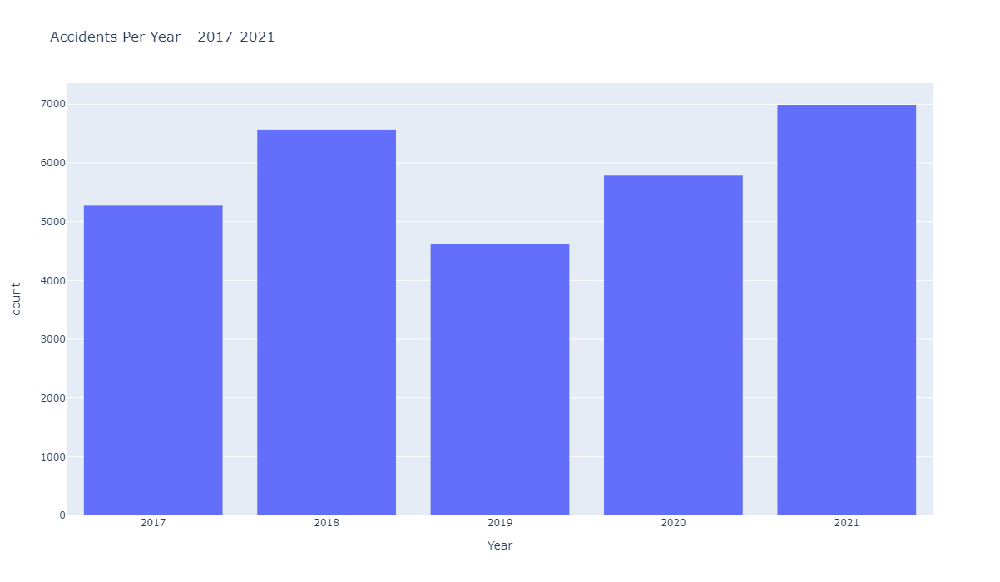

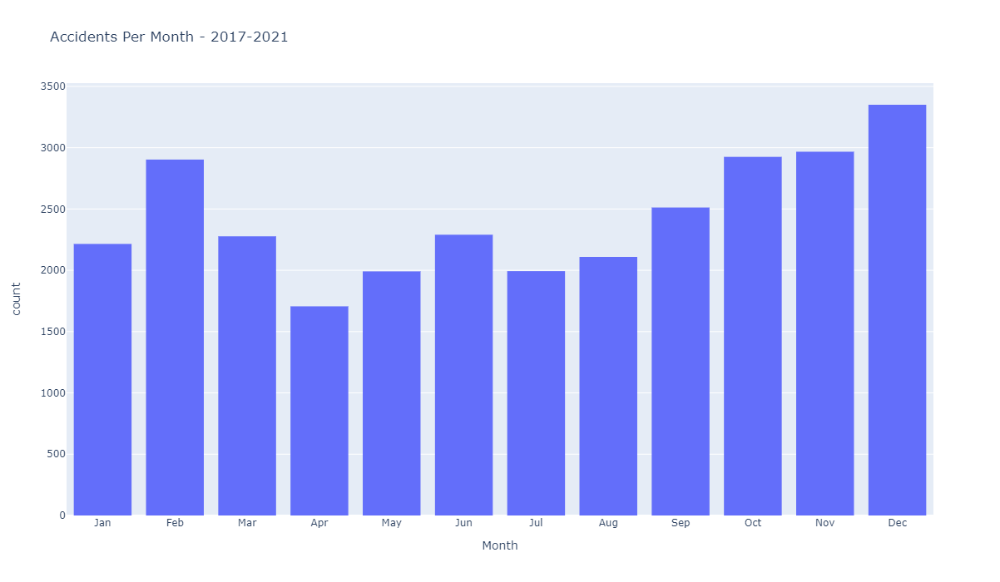

In [10]:
figYEAR = px.histogram(traffic_data, x = "Year", title = "Accidents Per Year - 2017-2021")
figYEAR.update_layout(bargap=0.2, height = 700, width = 1000)
figYEAR.show()

fig3 = px.histogram(traffic_data, x = "Month", title = "Accidents Per Month - 2017-2021", 
                    category_orders={"Month": ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]})
fig3.update_layout(bargap=0.2, height = 700, width = 1000)
fig3.show()

<br>

<font size="3">GAPS IN DATA:</font>

    Accidents per month in 2017 lacks a measure for january. Our traffic incidents dataset has no data from this month. Accidents per month in 2019 lacks measures for July, and only has one measurement for August.
    
    When mapping traffic volumes from 2021, it was discovered that the dataset contains a large gap, from aug-oct, and likely most of jul. Moving forward, we will use 2020 to examine incident and volume comparisons, as there is no visible data gaps in incidents, and volumes.
    
    We would have liked to analyze more years, but due to gaps in both datasets, and the fact that traffic volumes aren't available pre 2019, we are handcuffed to use 2020 solely for comparisons in this section.

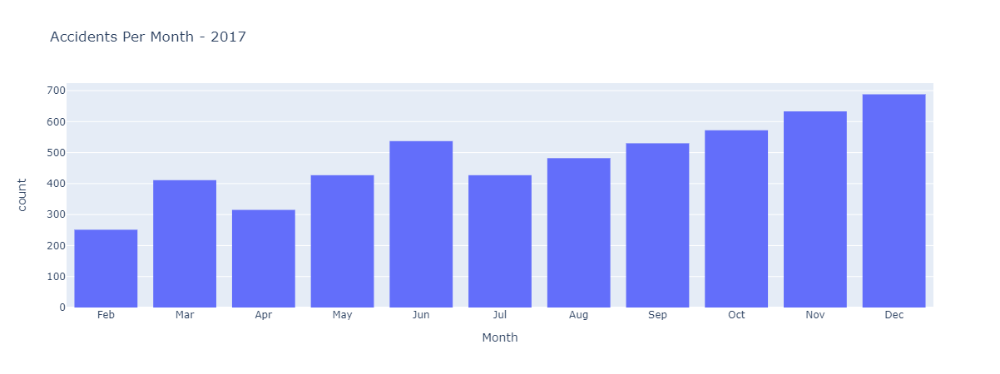

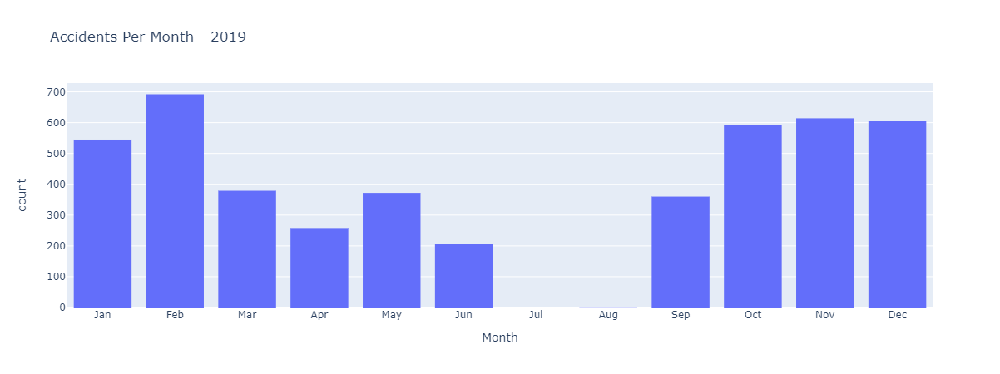

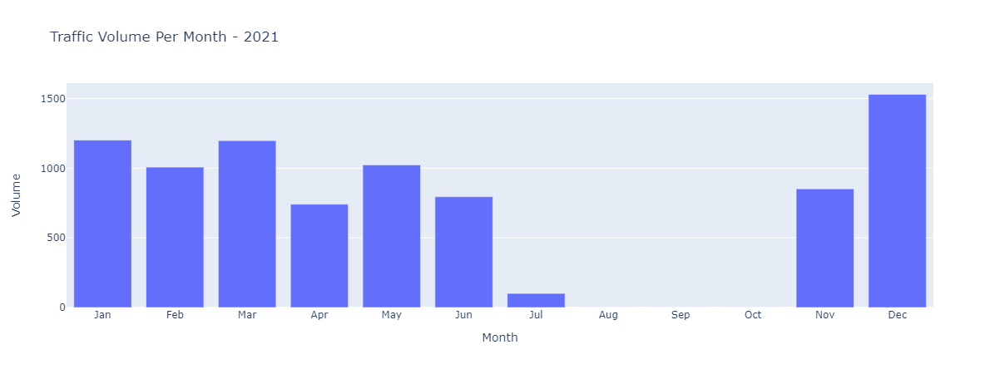

In [11]:
fig_missingdata = px.histogram(traffic_data_2017, x = "Month", title = "Accidents Per Month - 2017", 
                    category_orders={"Month": ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]})
fig_missingdata.update_layout(bargap=0.2)
fig_missingdata.show()


fig_missingdata2 = px.histogram(traffic_data_2019, x = "Month", title = "Accidents Per Month - 2019", 
                    category_orders={"Month": ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]})
fig_missingdata2.update_layout(bargap=0.2)
fig_missingdata2.show()

fig_missingdata3 = px.bar(volume_2021, x = months, y = monthly_vol_2021, title = "Traffic Volume Per Month - 2021") 
fig_missingdata3.update_layout(bargap=0.2, xaxis_title = "Month", yaxis_title = "Volume")
fig_missingdata3.show()

    Some calculations for accidents per month, day, and hour in 2020. To be used in the following comparisons.

In [12]:
months2020 = []
test = traffic_data1["Month"]
for i in range(13):
    if i > 0:
        count = test.loc[test == i].count()
        months2020.append(count)
        
print(months2020)

days2020 = []
test = traffic_data1["Day"]
for i in range(7):
    count = test.loc[test == i].count()
    days2020.append(count)
    
print(days2020)

hours2020 = []
test = traffic_data_2020["Hour"]
for i in range(24):
    count = test.loc[test == i].count()
    hours2020.append(count)

print(hours2020)

[2215, 2903, 2277, 1706, 1991, 2290, 1993, 2109, 2512, 2925, 2967, 3350]
[4130, 4607, 4781, 4600, 5061, 3450, 2609]
[83, 47, 50, 56, 39, 65, 180, 335, 315, 299, 252, 251, 301, 306, 392, 505, 598, 514, 369, 238, 186, 163, 135, 104]


    Let's compare accidents per month vs traffic volumes per month.

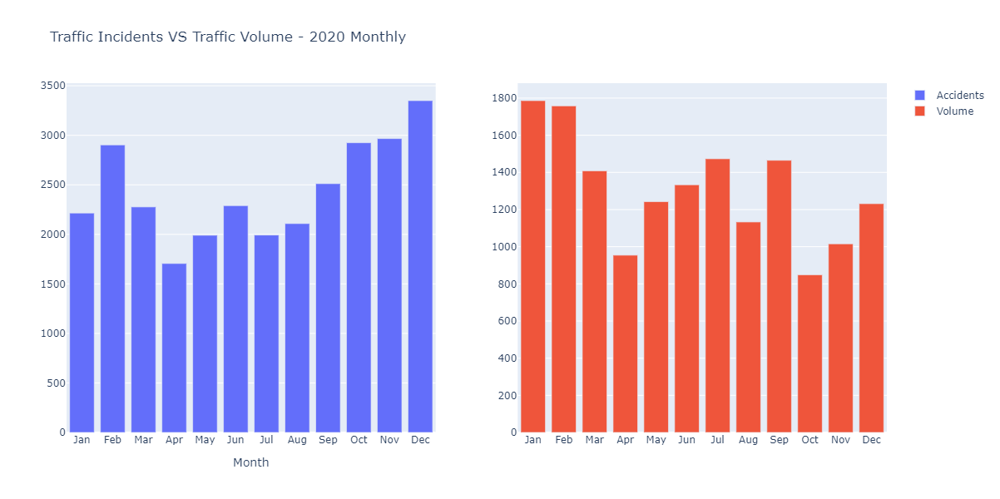

In [13]:
figCOMPARE_monthly = make_subplots(rows=1, cols=2)
#print(list(traffic_data_2020["Hour"]))
figCOMPARE_monthly.add_trace(
    go.Bar(x = months, y = months2020, name = "Accidents"),
    row=1, col=1
)

figCOMPARE_monthly.add_trace(
    go.Bar(x = months, y = monthly_vol_2020, name = "Volume"),
    row=1, col=2
)

figCOMPARE_monthly.update_layout(height=600, width=800, title_text="Traffic Incidents VS Traffic Volume - 2020 Monthly", xaxis_title = "Month")
figCOMPARE_monthly.show()

Upon initial examination, we can notice some disparities between the months of July, October, November, December, and January. Winter driving conditions likely explain the higher accidents vs observed volumes in Oct, Nov, and Dec. Because we see higher numbers of accidents in comparison to the volume of traffic, it’s a start to say that these months are likely more dangerous. As per the disparity in July, the higher volume compared to observed accidents may be due to family summer activities, as this coincides with right around summer vacation for elementary/high school students. Perhaps family drivers have their passengers in mind as they are travelling to partake in activities outside, and are thus driving more cautiously.

In January, we see higher volumes in comparison to accidents. Perhaps it's due to families traveling during the holidays, but it's odd as it doesnt follow the trend the other winter months show.


    Now let's compare accidents per weekday vs weekday traffic volumes.

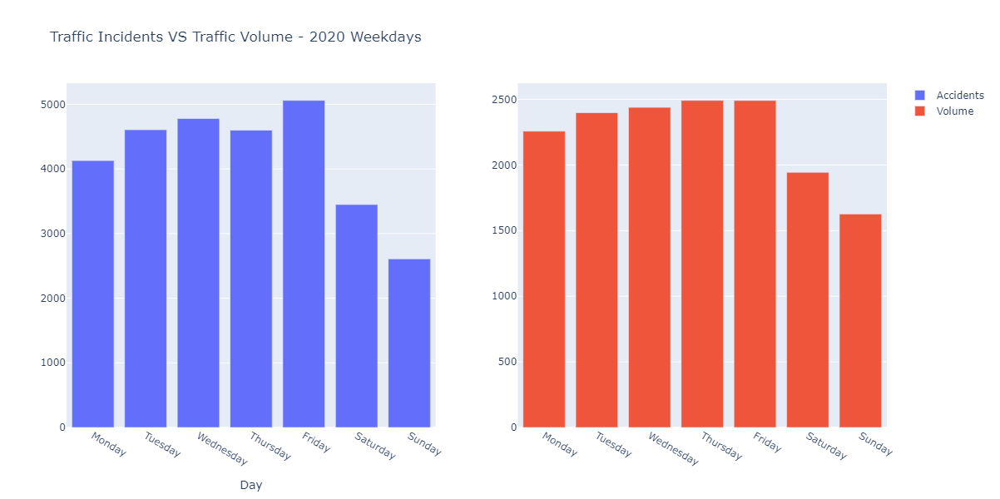

In [14]:
figCOMPARE_weekly = make_subplots(rows=1, cols=2)

figCOMPARE_weekly.add_trace(
    go.Bar(x = days, y = days2020, name = "Accidents"),
    row=1, col=1
)

figCOMPARE_weekly.add_trace(
    go.Bar(x = days, y = weekday_vol_2020, name = "Volume"),
    row=1, col=2
)

figCOMPARE_weekly.update_layout(height=600, width=800, title_text="Traffic Incidents VS Traffic Volume - 2020 Weekdays", xaxis_title = "Day")
figCOMPARE_weekly.show()

In examining the weekdays, we can see a few differences. First, volumes are very similar for Monday-Friday, but Friday appears to have slightly more accidents than other days. Because Friday is the end of the “conventional’ work week, it’s plausible that individuals eager to get home and enjoy their weekend are driving a little bit more recklessly (they’re more rushed than usual). Second, we notice that accidents, in comparison to volumes, are lower on the weekends. Saturday has 32% less accidents than Friday, compared to only 22% less traffic volume. Sunday has 50% less accidents than Friday, while having only 35% less traffic volume. Drivers on the weekend may be more cautious or just in less of a rush. 

Some insights we can draw from this comparison is Friday might be more dangerous, so be careful on Fridays! Saturday and Sunday seem to, comparatively, be safer. 


    Finally, Let's compare traffic volumes per hour

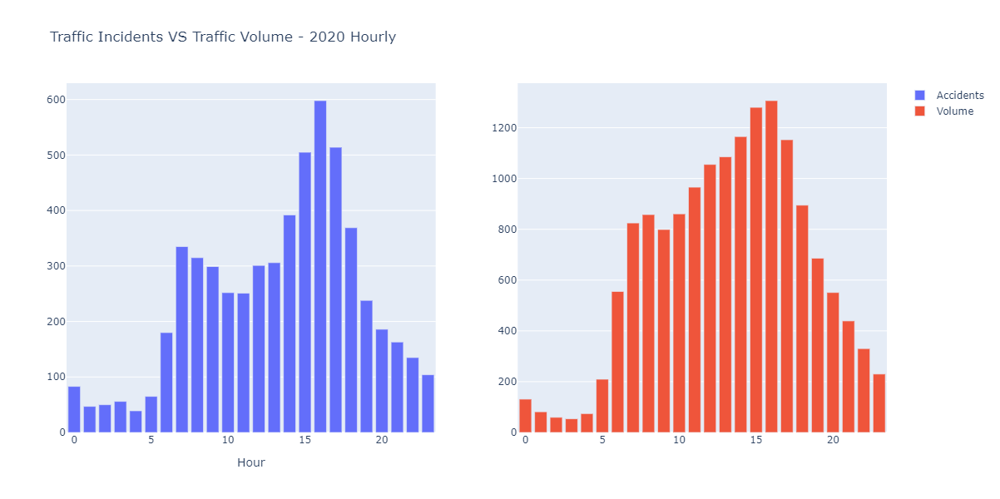

In [15]:
figCOMPARE_hour = make_subplots(rows=1, cols=2)

figCOMPARE_hour.add_trace(
    go.Bar(x = np.arange(24), y = hours2020, name = "Accidents"),
    row=1, col=1
)

figCOMPARE_hour.add_trace(
    go.Bar(x = np.arange(24), y = hourly_vol_2020, name = "Volume"),
    row=1, col=2
)

figCOMPARE_hour.update_layout(height=600, width=800, title_text="Traffic Incidents VS Traffic Volume - 2020 Hourly", xaxis_title = "Hour")
figCOMPARE_hour.show()

When comparing traffic incidents and volumes on an hourly basis, we can see two interesting trends: conventional rush hour times have accident spikes, and mid day traffic volumes do not match the mid day accidents we observe. The disparity in mid day traffic volumes is interesting, as it seems that these drivers are less prone to getting in accidents. Further exploration into vehicle types may help shed light on this, but that’s best saved for another time. While we do see comparable volumes at typical rush hour times, we do also see accident spikes. It’s likely that the typical 9-5, or 8-4 workday rushes to get to work, and get home, are creating an accident prone environment. 

Some insights we can gain from this is to please be careful when commuting to work. It can be a stressful time, but that doesn’t mean you shouldn’t practice safe driving habits. We can also begin to conclude that mid day drivers are either more cautious, more skilled, or less stressed. 

In [16]:
# Some commented out figures for visualization, if interested.

#fig = px.histogram(traffic_data_2020, x = "Day", title = "Accidents Per Weekday - 2020") 
#fig.update_layout(bargap=0.2)
#fig.show()

#fig4 = px.bar(volume_2021, x = np.arange(24), y = hourly_vol_2021, title = "Traffic Volume Per Hour - 2021") 
#fig4.update_layout(bargap=0.2, xaxis_title = "Hour", yaxis_title = "Volume")
#fig4.show()

#fig5 = px.bar(volume_2021, x = days, y = weekday_vol_2021, title = "Traffic Volume Per Weekday - 2021") 
#fig5.update_layout(bargap=0.2, xaxis_title = "Day", yaxis_title = "Volume")
#fig5.show()

#fig7 = px.bar(volume_2020, x = days, y = weekday_vol_2020, title = "Traffic Volume Per Weekday - 2020") 
#fig7.update_layout(bargap=0.2, xaxis_title = "Day", yaxis_title = "Volume")
#fig7.show()


#fig12 = px.histogram(traffic_data_2020, x = "Month", title = "Accidents Per Month - 2020")
#fig12.update_layout(bargap=0.2)
#fig12.show()

#fig8 = px.bar(volume_2020, x = months, y = monthly_vol_2020, title = "Traffic Volume Per Month - 2020") 
#fig8.update_layout(bargap=0.2, xaxis_title = "Month", yaxis_title = "Volume")
#fig8.show()

    Geographical analysis of high population density areas may provide more insights on traffic accidents. Future work with these types of visualizations would be useful to supplement our project.
    visit: #https://imgur.com/a/m20jdxQ for relevant images

Text(0.5, 1.0, 'Traffic Accident Locations in Calgary - 2020')

<Figure size 432x288 with 0 Axes>

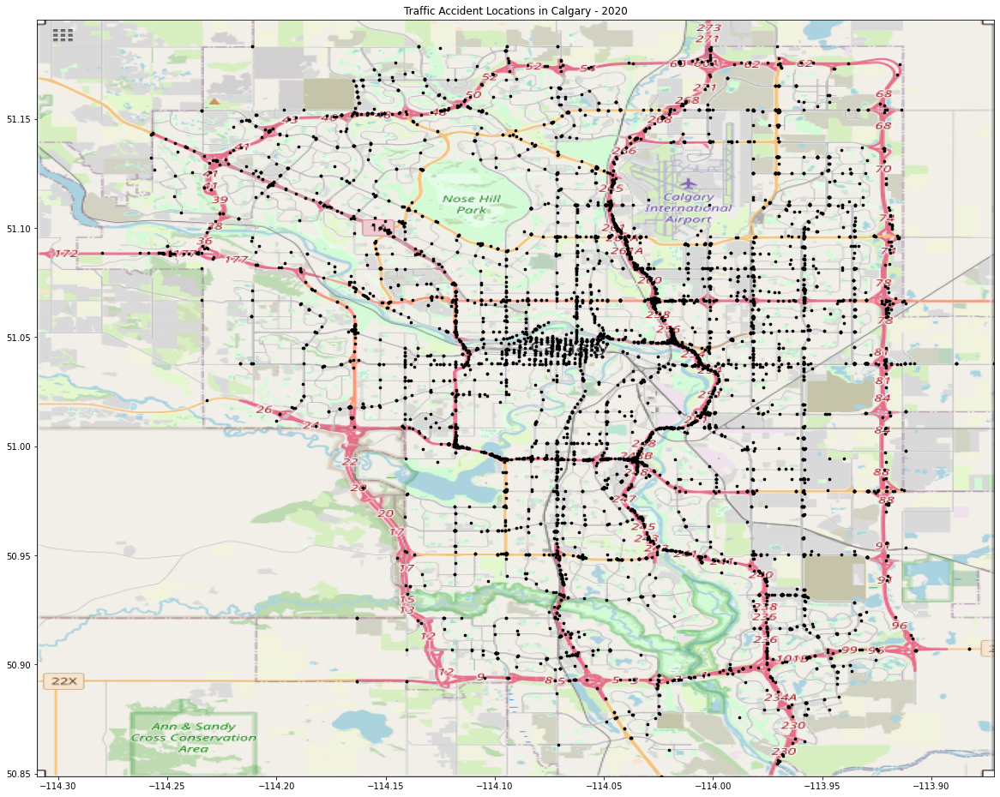

In [17]:
# create a map dataframe with relevent info. Remove indexes with ambiguous lat/long values. Restrict date to 2020. 
# set area of our map (max/min lat long values from the dataset, matched with the image.
map_df = dft[["START_DT","Longitude", "Latitude"]]
map_df = map_df.drop(labels=[10702, 21380], axis=0)
map_df_2020 = map_df.loc[(dft.START_DT > "2020-") & (dft.START_DT < "2021-")]

area = (-114.3097701, -113.8713622, 50.84874399, 51.19564827)

calgary = plt.imread('calgarymap.png')

y2020 = plt.figure()
plt.figure(figsize=(20,28))
plt.scatter(map_df_2020.Longitude, map_df_2020.Latitude, c='black', s=7)
plt.imshow(calgary, zorder=0, extent = area, aspect= 'equal')
plt.title("Traffic Accident Locations in Calgary - 2020")

    Sub area examination may also provide useful, for example, the downtown core. We see a high number of accidents in this small area (upwards of 10% of yearly accidents are here)

Text(0.5, 1.0, 'Traffic Accident Locations in Calgary DTC - 2020')

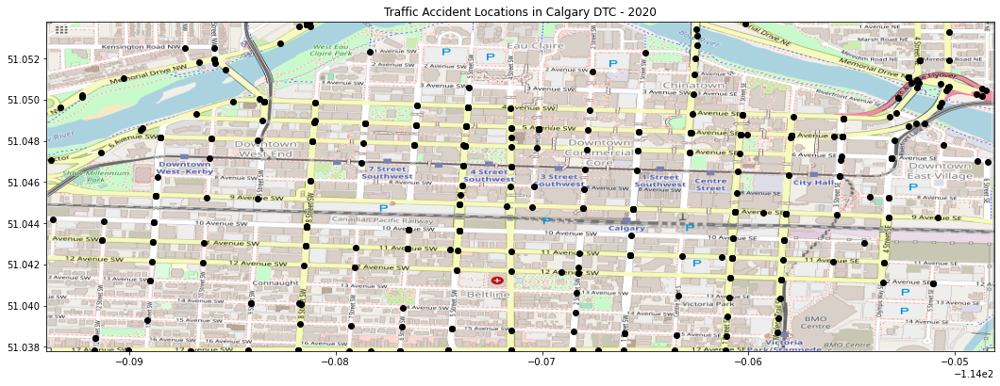

In [19]:
# downtown core (DTC) dataframe, with restricted long/lat values. thanks to https://www.openstreetmap.org/ for their resources.
dtc = map_df_2020.loc[(map_df_2020.Latitude > 51.0378) & (map_df_2020.Latitude < 51.0538) & (map_df_2020.Longitude > -114.0940) & (map_df_2020.Longitude < -114.0481)]
dtcs = [420,388,527] #2018,2020,2021

downtown = plt.imread("DTcore.png")

plt.figure(figsize=(18,12))
plt.scatter(dtc.Longitude, dtc.Latitude, c="black")
plt.imshow(downtown, zorder=0, extent = (-114.0940, -114.0481, 51.0378, 51.0538), aspect= 'equal')
plt.title("Traffic Accident Locations in Calgary DTC - 2020")

<br>

# Section 2

The following section is by Amy Zhao

## Has the number of traffic accidents changed since the start of the COVID pandemic? ##

With a global pandemic happening for the past two years, we decided it would be interesting to look at traffic data from before the pandemic in comparison to during the pandemic and all the way up until present. 

We had hypothesized that traffic incidents would go down as a result of mandatory lockdowns and many people starting to work from home. In order to create a comparison, we looked at the four different quadrants of Calgary to create our analysis. 

First, we started off by looking at traffic incidents before the pandemic. For this we chose to look at data a couple years prior from 2016-2019 as we felt like this would give us sufficient information to compare to the two years of the pandemic. Our traffic dataset contained a column titled "QUADRANTS", making it easy to divide the counts of each quadrant however when looking through the data, we realized that many rows were empty however there was a different column titled "INCIDENT INFO" with the names of the roads and the quadrants at the end so we accounted for this by creating a for loop to make sure we accounted for as much data as possible to ensure accuracy. This can be seen with the code below. 

16781
(2837, 4424, 3605, 5641)


(0.0, 6000.0)

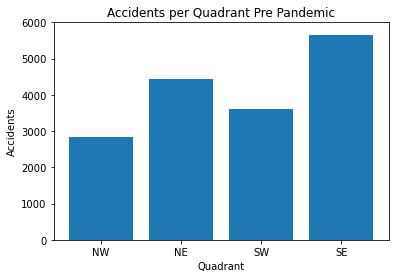

In [20]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt

df_q = pd.read_csv('Traffic_Incidents.csv')

func123 = lambda x: x[len(x)-3:len(x)]
quads = df_q.loc[(df_q.START_DT > "2016") & (df_q.START_DT < "2020")]
quads = quads["INCIDENT INFO"]
quads = quads.apply(func123)
print(len(quads))
NE = 0
NW = 0
SW = 0
SE = 0
for item in quads:
    if str(item) == " SE":
        SE +=1
    if str(item) == " NE":
        NE +=1
    if str(item) == " SW":
        SW +=1
    if str(item) == " NW":
        NW +=1
print((NW,NE,SW,SE))

plt.bar(["NW", "NE", "SW", "SE"], (NW,NE,SW,SE))
plt.title("Accidents per Quadrant Pre Pandemic")
plt.xlabel("Quadrant")
plt.ylabel("Accidents")
plt.ylim([0,6000])


(2094, 3571, 2500, 4286)


(0.0, 6000.0)

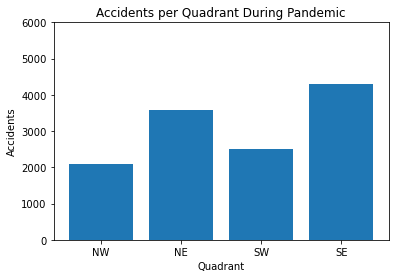

In [21]:
func123 = lambda x: x[len(x)-3:len(x)]
quads1 = df_q.loc[(df_q.START_DT > "2020") & (df_q.START_DT < "2022")]
quads1 = quads1["INCIDENT INFO"]
quads1 = quads1.apply(func123)
NE = 0
NW = 0
SW = 0
SE = 0
for item in quads1:
    if str(item) == " SE":
        SE +=1
    if str(item) == " NE":
        NE +=1
    if str(item) == " SW":
        SW +=1
    if str(item) == " NW":
        NW +=1
print((NW,NE,SW,SE))

plt.bar(["NW", "NE", "SW", "SE"], (NW,NE,SW,SE))
plt.title("Accidents per Quadrant During Pandemic")
plt.xlabel("Quadrant")
plt.ylabel("Accidents")
plt.ylim([0,6000])


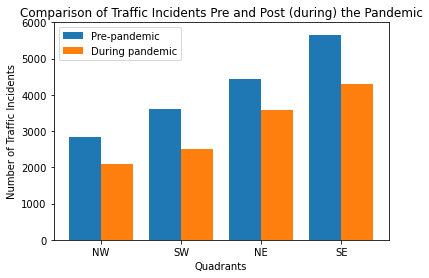

In [22]:
quadrants = ['NW', 'SW', 'NE', 'SE']
prepandemic = [2837, 3605, 4424, 5641]
duringpandemic = [2094, 2500, 3571, 4286]

x_axis = np.arange(len(quadrants))
plt.bar(x_axis -0.2, prepandemic, width=0.4, label = 'Pre-pandemic')
plt.bar(x_axis +0.2, duringpandemic, width=0.4, label = 'During pandemic')

# xticks
plt.xticks(x_axis, quadrants)

# Add legend

plt.legend()
plt.title("Comparison of Traffic Incidents Pre and Post (during) the Pandemic")
plt.xlabel("Quadrants")
plt.ylabel("Number of Traffic Incidents")
plt.ylim([0,6000])

plt.show()

As we can see from the chart above, traffic incidents decreased during the pandemic in comparison to pre-pandemic. Additionally, the trends of each quadrant still tend to be the same with the eastern quadrants of Calgary having a higher amount of traffic incidents than the western parts of the city. 

Though traffic incidents decreased during the pandemic, it would be interesting to see if fatality of these accidents decreased as well. For further exploration, comparing data of traffic incidents and fatality rates pre and post pandemic could provide an interesting topic to explore. 

<br>

# Section 3

The following section is by Khizer Kamran

# Part A

### Comparison of the top 5 total incidents with respect to the 'Pedestrians' category found within the city (during the Summer months from 2017 to 2021, excluding 2022)?

In [1]:
import pandas as pd #Import Pandas as pd to help with reading and converting the .csv file
import matplotlib.pyplot as plt #Help with plotting the data distributions

Part 1: 2017
Two vehicle incident.                                            1734
Single vehicle incident.                                          555
Multi-vehicle incident.                                           329
There is an incident involving a pedestrian.                      132
Traffic signals are flashing red. Crews have been dispatched.      56
Two vehicle incident. Blocking the right lane.                     48
Two vehicle incident. Blocking the left lane.                      41
Name: DESCRIPTION, dtype: int64


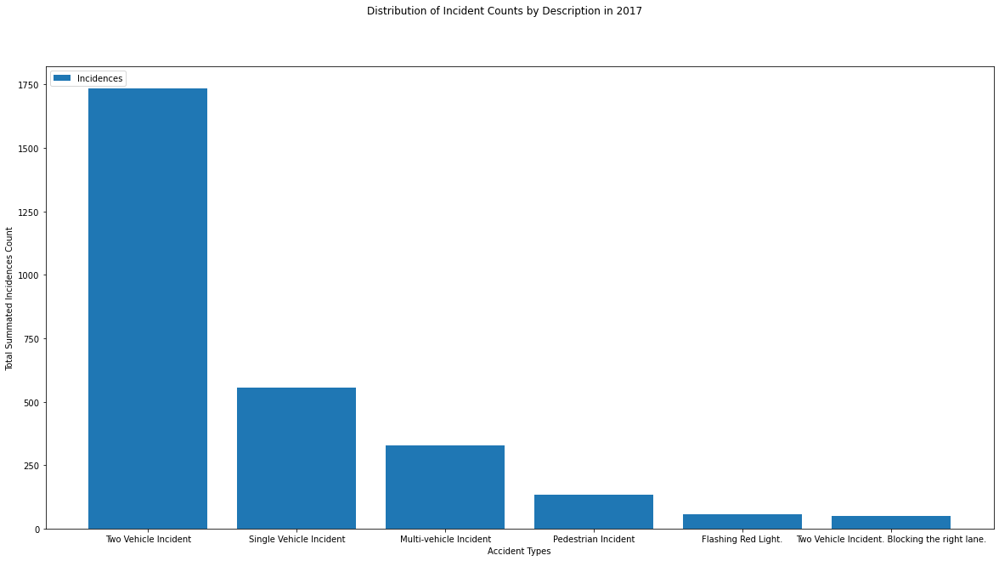

In [2]:
print("Part 1: 2017")

df = pd.read_csv('Traffic_Incidents.csv', delimiter = ',') #Import the traffice incidences .csv file and separate with ','

start_date = "2017-06-01"
end_date = "2017-8-31"

after_start_date = df["START_DT"] >= start_date
before_end_date = df["START_DT"] <= end_date
between_two_dates = after_start_date & before_end_date
filtered_dates = df.loc[between_two_dates]

filtered_dates_desc = filtered_dates['DESCRIPTION'].value_counts()

print(filtered_dates_desc[0:7])

tci = 1734
svi = 555
mvi = 329
p = 132
tsr = 56
brl = 48

fig = plt.figure(figsize=(20, 10)) #Create a figure with dimensions (heightxwidth) of 10x7

fig.suptitle('Distribution of Incident Counts by Description in 2017') #Title for the figure

cat_labels = ['Two Vehicle Incident', 'Single Vehicle Incident', 'Multi-vehicle Incident', 'Pedestrian Incident', 'Flashing Red Light.', 'Two Vehicle Incident. Blocking the right lane.'] #Category x labels

number_of_gen = [tci, svi, mvi, p, tsr, brl] #First subplot values

plt.bar(cat_labels,number_of_gen,label="Incidences") #Putting all bar chart elements together with color

plt.xlabel("Accident Types") #X label

plt.ylabel("Total Summated Incidences Count") #Y label

plt.legend(loc='upper left') #Create legend

plt.show() #Illustrate plots

Part 2: 2018
Two vehicle incident.                                            707
Single vehicle incident.                                         178
Multi-vehicle incident.                                          121
There is an incident involving a pedestrian.                      40
Traffic signals are flashing red. Crews have been dispatched.     38
Two vehicle incident. Blocking the right lane                     34
Two vehicle incident. Blocking the left lane                      21
Name: DESCRIPTION, dtype: int64


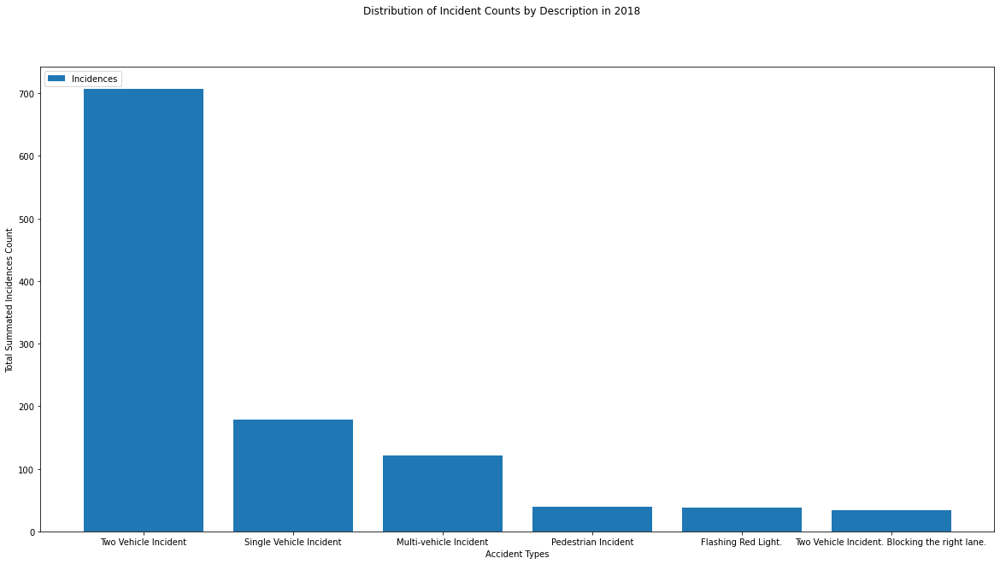

In [3]:

print("Part 2: 2018")

df = pd.read_csv('Traffic_Incidents.csv', delimiter = ',') #Import the traffice incidences .csv file and separate with ','

start_date = "2018-06-01"
end_date = "2018-08-31"

after_start_date = df["START_DT"] >= start_date
before_end_date = df["START_DT"] <= end_date
between_two_dates = after_start_date & before_end_date
filtered_dates = df.loc[between_two_dates]

filtered_dates_desc = filtered_dates['DESCRIPTION'].value_counts()

print(filtered_dates_desc[0:7])

tci = 707
svi = 178
mvi = 121
p = 40
tsr = 38
brl = 34

fig = plt.figure(figsize=(20, 10)) #Create a figure with dimensions (heightxwidth) of 10x7

fig.suptitle('Distribution of Incident Counts by Description in 2018') #Title for the figure

cat_labels = ['Two Vehicle Incident', 'Single Vehicle Incident', 'Multi-vehicle Incident', 'Pedestrian Incident', 'Flashing Red Light.', 'Two Vehicle Incident. Blocking the right lane.'] #Category x labels

number_of_gen = [tci, svi, mvi, p, tsr, brl] #First subplot values

plt.bar(cat_labels,number_of_gen,label="Incidences") #Putting all bar chart elements together with color

plt.xlabel("Accident Types") #X label

plt.ylabel("Total Summated Incidences Count") #Y label

plt.legend(loc='upper left') #Create legend

plt.show() #Illustrate plots

Part 3: 2019
Two vehicle incident.                               72
Multi-vehicle incident.                             15
Single vehicle incident.                            15
Multi-vehicle incident. Blocking the right lane      6
Two vehicle incident. Blocking the right lane.       5
There is an incident involving a pedestrian.         5
Multi-vehicle incident. Blocking the right lane.     4
Name: DESCRIPTION, dtype: int64


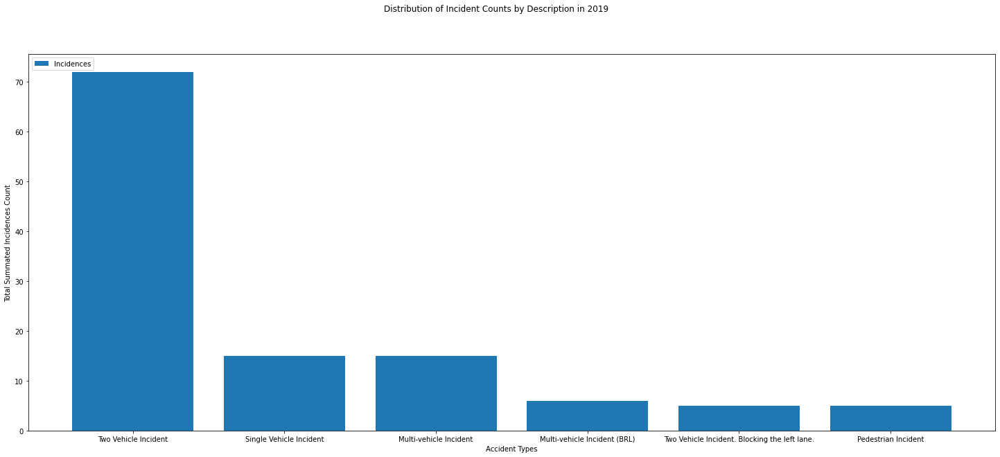

In [4]:

print("Part 3: 2019")

df = pd.read_csv('Traffic_Incidents.csv', delimiter = ',') #Import the traffice incidences .csv file and separate with ','

start_date = "2019-06-01"
end_date = "2019-08-31"

after_start_date = df["START_DT"] >= start_date
before_end_date = df["START_DT"] <= end_date
between_two_dates = after_start_date & before_end_date
filtered_dates = df.loc[between_two_dates]

filtered_dates_desc = filtered_dates['DESCRIPTION'].value_counts()

print(filtered_dates_desc[0:7])

tci = 72
svi = 15
mvi = 15
mvi_brl = 6
bll = 5
brl = 5

fig = plt.figure(figsize=(25, 10)) #Create a figure with dimensions (heightxwidth) of 10x7

fig.suptitle('Distribution of Incident Counts by Description in 2019') #Title for the figure

cat_labels = ['Two Vehicle Incident', 'Single Vehicle Incident', 'Multi-vehicle Incident', 'Multi-vehicle Incident (BRL)', 'Two Vehicle Incident. Blocking the left lane.', 'Pedestrian Incident'] #Category x labels

number_of_gen = [tci, svi, mvi, mvi_brl, bll, brl] #First subplot values

plt.bar(cat_labels,number_of_gen,label="Incidences") #Putting all bar chart elements together with color

plt.xlabel("Accident Types") #X label

plt.ylabel("Total Summated Incidences Count") #Y label

plt.legend(loc='upper left') #Create legend

plt.show() #Illustrate plots

Part 4: 2020
Traffic incident.                                443
Two vehicle incident.                             98
Two vehicle incident. Blocking the right lane     46
There is an incident involving a pedestrian.      42
Traffic incident. Blocking the right lane         38
Traffic incident. Blocking the right lane.        33
There is an incident involving a cyclist.         28
Name: DESCRIPTION, dtype: int64


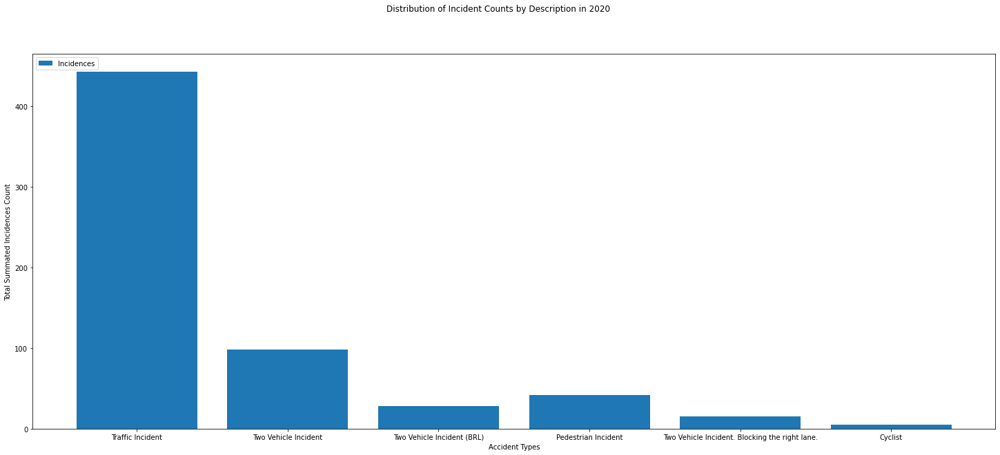

In [5]:
print("Part 4: 2020")

df = pd.read_csv('Traffic_Incidents.csv', delimiter = ',') #Import the traffice incidences .csv file and separate with ','

start_date = "2020-06-01"
end_date = "2020-08-31"

after_start_date = df["START_DT"] >= start_date
before_end_date = df["START_DT"] <= end_date
between_two_dates = after_start_date & before_end_date
filtered_dates = df.loc[between_two_dates]

filtered_dates_desc = filtered_dates['DESCRIPTION'].value_counts()

print(filtered_dates_desc[0:7])

ti = 443
tvi = 98
tvi_brl = 46
p = 42
ti_brl = 38 + 33
c = 28

fig = plt.figure(figsize=(25, 10)) #Create a figure with dimensions (heightxwidth) of 10x7

fig.suptitle('Distribution of Incident Counts by Description in 2020') #Title for the figure

cat_labels = ['Traffic Incident', 'Two Vehicle Incident', 'Two Vehicle Incident (BRL)', 'Pedestrian Incident', 'Two Vehicle Incident. Blocking the right lane.', 'Cyclist'] #Category x labels

number_of_gen = [ti, tvi, c, p, svi, brl] #First subplot values

plt.bar(cat_labels,number_of_gen,label="Incidences") #Putting all bar chart elements together with color

plt.xlabel("Accident Types") #X label

plt.ylabel("Total Summated Incidences Count") #Y label

plt.legend(loc='upper left') #Create legend

plt.show() #Illustrate plots

Part 5: 2021
Traffic incident.                                            648
Traffic incident. Blocking the right lane                     93
Two vehicle incident. Blocking the right lane                 66
Two vehicle incident. Blocking the left lane                  48
Traffic incident. Blocking the left lane                      46
There is an incident involving a pedestrian- EMS on site.     37
Two vehicle incident.                                         26
Name: DESCRIPTION, dtype: int64


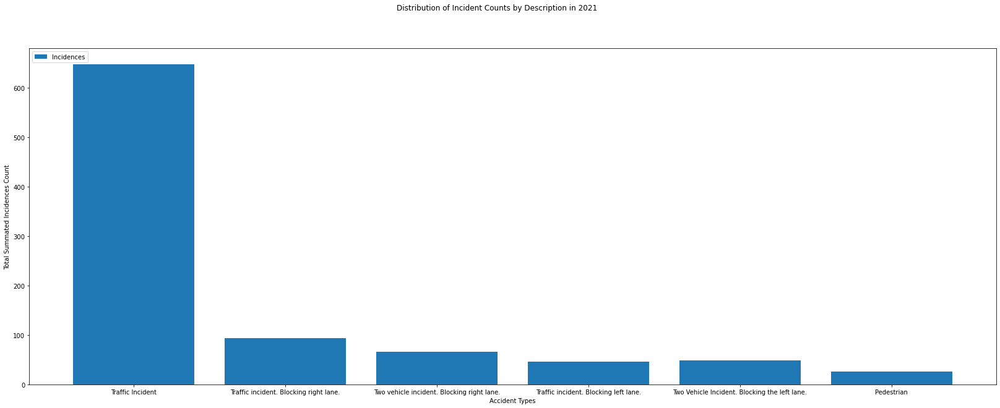

In [6]:

print("Part 5: 2021")

df = pd.read_csv('Traffic_Incidents.csv', delimiter = ',') #Import the traffice incidences .csv file and separate with ','

start_date = "2021-06-01"
end_date = "2021-08-31"

after_start_date = df["START_DT"] >= start_date
before_end_date = df["START_DT"] <= end_date
between_two_dates = after_start_date & before_end_date
filtered_dates = df.loc[between_two_dates]

filtered_dates_desc = filtered_dates['DESCRIPTION'].value_counts()

print(filtered_dates_desc[0:7])

ti = 648
ti_brl = 93
tvi_brl = 66
ti_bll = 46
tvi_bll = 48
tvi = 26
p = 37

fig = plt.figure(figsize=(28, 10)) #Create a figure with dimensions (heightxwidth) of 10x7

fig.suptitle('Distribution of Incident Counts by Description in 2021') #Title for the figure

cat_labels = ['Traffic Incident', 'Traffic incident. Blocking right lane.', 'Two vehicle incident. Blocking right lane.', 'Traffic incident. Blocking left lane.', 'Two Vehicle Incident. Blocking the left lane.', 'Pedestrian'] #Category x labels

number_of_gen = [ti, ti_brl, tvi_brl, ti_bll, tvi_bll, tvi] #First subplot values

plt.bar(cat_labels,number_of_gen,label="Incidences") #Putting all bar chart elements together with color

plt.xlabel("Accident Types") #X label

plt.ylabel("Total Summated Incidences Count") #Y label

plt.legend(loc='upper left') #Create legend

plt.show() #Illustrate plots

# Question Insights, Part A

Pre-pandemic yearly trends (2017 - 2019):
* Two vehicle incidents were the highest reported incidences in each year
* Single vehicle incidents were consistently the 2nd highest reported in each year 
* Multi-vehicle incidents were consistently the 3rd highest reported in each year 
* In 2017/18 pedestrian incidences were the 4th highest reported in each respective year; 6th highest in 2019
* In 2017/18 traffic signal incidences and two vehichle (blocked right lane) incidences were the 5th and 6th highest reported in both years
* In 2019 multi-vehicle incidences and two vehicle incidences (blocked right lane) were the 5th and 6th highest reported in both years

Pandemic yearly trends (2020 - 2021):
* Traffic incidences were the highest reported incidences in each year; traffic incidences refer to road conditions and their associated car accidents

 In 2020:
    * Two vehicle incidences were the 2nd highest reported 
    * Two vehicle incidences (blocked right lane) were the 3rd highest reported
    * Traffic incidences (blocked right lane) 4th highest reported
    * Pedestrian incidences 5th highest reported
    * Cyclist incidences 6th highest reported
  
 In 2021:
    * Traffic incidences (blocked right lane) 2nd highest reported
    * Two vehicle incidences (blocked right lane) 3rd highest reported
    * Two vehicle incidences (blocked left lane) 4th highest reported
    * Traffic incidences (blocked left lane) 5th highest reported
    * Pedestrian incidences 6th highest reported

Conclusions:

What we see is that comparatively from 2017 to 2021, the number of pedestrian incidences decreases whilst most other categories increase in reported counts. We can infer from this finding is that individuals arent out of the home as much. This is likely due to the pandemic with associated quarantines and lockdowns. There is a also a lesser amount of pedestrian incidences that occur within the summer months within this time period. 

# Part B

## What is the relationship between car incidences and the respective times in which the incidences occurred (sample of the most recurring instances) (from 2017 to 2021, excluding 2020 & 2022)?

In [7]:
from datetime import datetime #Import datetime to help with date and time conversions
import pandas as pd #Import Pandas as pd to help with reading and converting the .csv file
import matplotlib.pyplot as plt #Import matplotlib to help with creating a time series
import numpy as np

Part 1: 2017
[364.33613445378154, 330.1602441816101, 297.037037037037, 300.35714285714283, 450.0, 306.84466019417476]


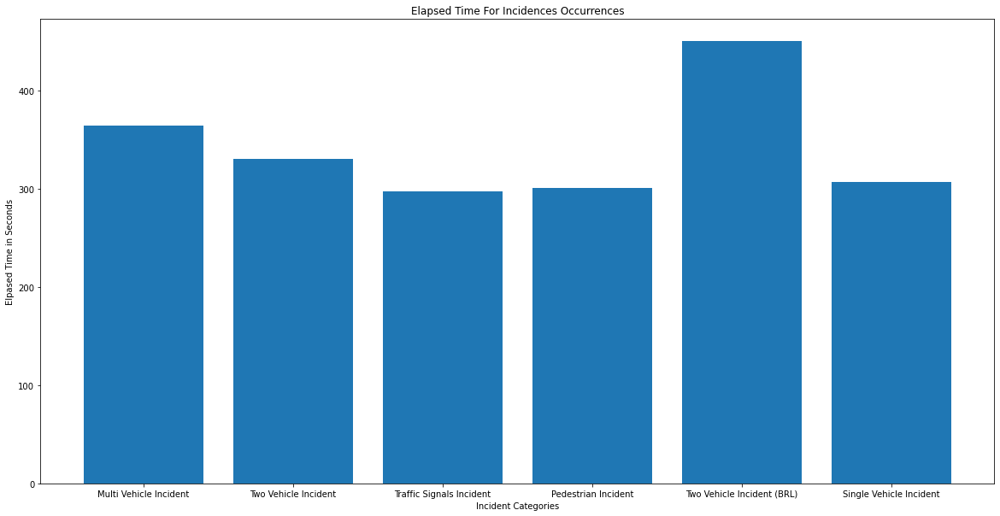

In [8]:
print("Part 1: 2017")

df = pd.read_csv('Traffic_Incidents.csv', delimiter = ',') #Import the traffice incidences .csv file and separate with ','

start_date = "2017-01-01"
end_date = "2017-12-31"

after_start_date = df["START_DT"] >= start_date
before_end_date = df["START_DT"] <= end_date
between_two_dates = after_start_date & before_end_date
df = df.loc[between_two_dates]

df = [list(row) for row in df.values] #Use list comprehension to help with reading lines of the .csv file

def avg_single(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Single vehicle incident.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_single = avg_single(df)
list_single_avg = (sum(list_single)/len(list_single))

def avg_multi(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Multi-vehicle incident.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_multi = avg_multi(df)
list_multi_avg = (sum(list_multi)/len(list_multi))

def avg_two(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Two vehicle incident.' or '2 vehicle incident.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_two = avg_two(df)
list_two_avg = (sum(list_two)/len(list_two))

def avg_t(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Traffic signals are flashing red. Crews have been dispatched.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_t = avg_t(df)
list_t_avg = (sum(list_t)/len(list_t))

def avg_p(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'There is an incident involving a pedestrian.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_p = avg_p(df)
list_p_avg = (sum(list_p)/len(list_p))

def avg_s(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Two vehicle incident. Blocking the right lane.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_s = avg_s(df)
list_s_avg = (sum(list_s)/len(list_s))

start_list = []
start_list.append(list_multi_avg)
start_list.append(list_two_avg)
start_list.append(list_t_avg)
start_list.append(list_p_avg)
start_list.append(list_s_avg)
start_list.append(list_single_avg)

final_list = []
final_list.append('Multi Vehicle Incident')
final_list.append('Two Vehicle Incident')
final_list.append('Traffic Signals Incident')
final_list.append('Pedestrian Incident')
final_list.append('Two Vehicle Incident (BRL)')
final_list.append('Single Vehicle Incident')

print(start_list)

#plt.rc('font', size=32) #Font and size of the lettering of the graph
fig, ax = plt.subplots(figsize=(20, 10)) #Create 1 plot within the mentioned size of the figure

# Specify how our lines should look
ax.bar(final_list, start_list, label='Elapsed Time') #Create a time series with the start times and elapsed times, the line should be the color orange and give it appropriate labels for the legend 

# Same as above
ax.set_xlabel('Incident Categories') #X axis label
ax.set_ylabel('Elpased Time in Seconds') #Y axis label
ax.set_title('Elapsed Time For Incidences Occurrences') #Figure title
#ax.grid(True) #Grid lines
# ax.legend(loc='upper left') #Create legend
plt.show() #Show graph

Part 2: 2018
[2341.4968814968815, 1886.6402197131522, 2110.09900990099, 2155.1131221719456, 1712.9032258064517, 2009.5837187789084]


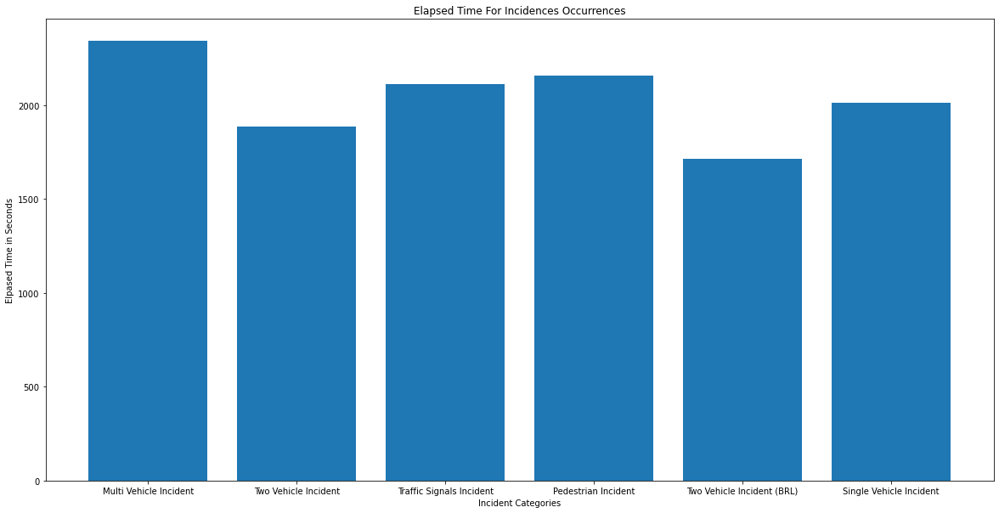

In [9]:

print("Part 2: 2018")

df = pd.read_csv('Traffic_Incidents.csv', delimiter = ',') #Import the traffice incidences .csv file and separate with ','

start_date = "2018-01-01"
end_date = "2018-12-31"

after_start_date = df["START_DT"] >= start_date
before_end_date = df["START_DT"] <= end_date
between_two_dates = after_start_date & before_end_date
df = df.loc[between_two_dates]

df = [list(row) for row in df.values] #Use list comprehension to help with reading lines of the .csv file

def avg_single(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Single vehicle incident.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_single = avg_single(df)
list_single_avg = (sum(list_single)/len(list_single))

def avg_multi(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Multi-vehicle incident.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_multi = avg_multi(df)
list_multi_avg = (sum(list_multi)/len(list_multi))

def avg_two(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Two vehicle incident.' or '2 vehicle incident.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_two = avg_two(df)
list_two_avg = (sum(list_two)/len(list_two))

def avg_t(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Traffic signals are flashing red. Crews have been dispatched.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_t = avg_t(df)
list_t_avg = (sum(list_t)/len(list_t))

def avg_p(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'There is an incident involving a pedestrian.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_p = avg_p(df)
list_p_avg = (sum(list_p)/len(list_p))

def avg_s(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Two vehicle incident. Blocking the right lane.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_s = avg_s(df)
list_s_avg = (sum(list_s)/len(list_s))

start_list = []
start_list.append(list_multi_avg)
start_list.append(list_two_avg)
start_list.append(list_t_avg)
start_list.append(list_p_avg)
start_list.append(list_s_avg)
start_list.append(list_single_avg)

final_list = []
final_list.append('Multi Vehicle Incident')
final_list.append('Two Vehicle Incident')
final_list.append('Traffic Signals Incident')
final_list.append('Pedestrian Incident')
final_list.append('Two Vehicle Incident (BRL)')
final_list.append('Single Vehicle Incident')

print(start_list)

#plt.rc('font', size=32) #Font and size of the lettering of the graph
fig, ax = plt.subplots(figsize=(20, 10)) #Create 1 plot within the mentioned size of the figure

# Specify how our lines should look
ax.bar(final_list, start_list, label='Elapsed Time') #Create a time series with the start times and elapsed times, the line should be the color orange and give it appropriate labels for the legend 

# Same as above
ax.set_xlabel('Incident Categories') #X axis label
ax.set_ylabel('Elpased Time in Seconds') #Y axis label
ax.set_title('Elapsed Time For Incidences Occurrences') #Figure title
#ax.grid(True) #Grid lines
# ax.legend(loc='upper left') #Create legend
plt.show() #Show graph

Part 3: 2019
[2744.0625, 2269.589235127479, 2080.0, 2430.0, 1344.7058823529412, 2316.986301369863]


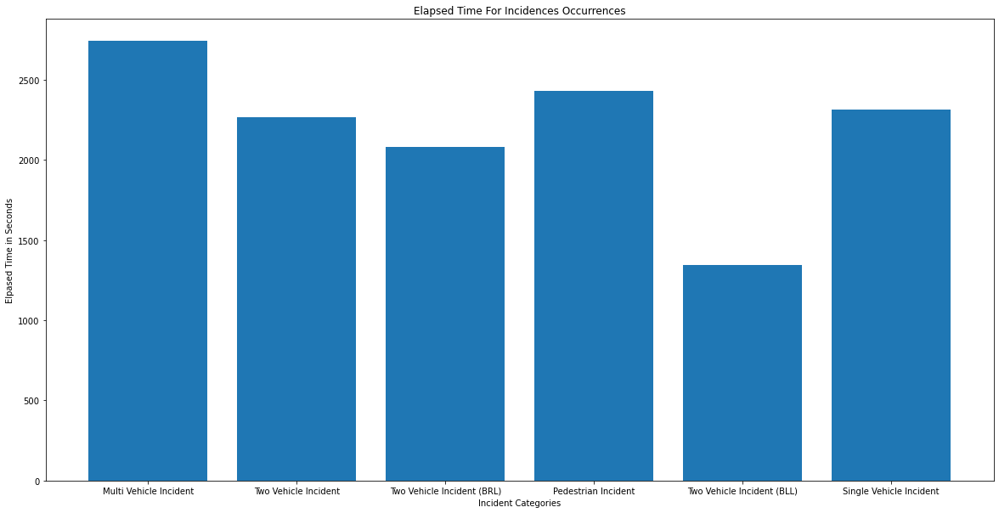

In [10]:

print("Part 3: 2019")

df = pd.read_csv('Traffic_Incidents.csv', delimiter = ',') #Import the traffice incidences .csv file and separate with ','

start_date = "2019-01-01"
end_date = "2019-12-31"

after_start_date = df["START_DT"] >= start_date
before_end_date = df["START_DT"] <= end_date
between_two_dates = after_start_date & before_end_date
df = df.loc[between_two_dates]
df = df.dropna()

df = [list(row) for row in df.values] #Use list comprehension to help with reading lines of the .csv file

def avg_single(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Single vehicle incident.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(str(end_time), '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_single = avg_single(df)
list_single_avg = (sum(list_single)/len(list_single))

def avg_multi(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Multi-vehicle incident.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_multi = avg_multi(df)
list_multi_avg = (sum(list_multi)/len(list_multi))

def avg_two(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Two vehicle incident.' or '2 vehicle incident.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_two = avg_two(df)
list_two_avg = (sum(list_two)/len(list_two))

def avg_t(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Two vehicle incident. Blocking the right lane.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_t = avg_t(df)
list_t_avg = (sum(list_t)/len(list_t))

def avg_p(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'There is an incident involving a pedestrian.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_p = avg_p(df)
list_p_avg = (sum(list_p)/len(list_p))

def avg_s(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Two vehicle incident. Blocking the left lane.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_s = avg_s(df)
list_s_avg = (sum(list_s)/len(list_s))

start_list = []
start_list.append(list_multi_avg)
start_list.append(list_two_avg)
start_list.append(list_t_avg)
start_list.append(list_p_avg)
start_list.append(list_s_avg)
start_list.append(list_single_avg)

final_list = []
final_list.append('Multi Vehicle Incident')
final_list.append('Two Vehicle Incident')
final_list.append('Two Vehicle Incident (BRL)')
final_list.append('Pedestrian Incident')
final_list.append('Two Vehicle Incident (BLL)')
final_list.append('Single Vehicle Incident')

print(start_list)

#plt.rc('font', size=32) #Font and size of the lettering of the graph
fig, ax = plt.subplots(figsize=(20, 10)) #Create 1 plot within the mentioned size of the figure

# Specify how our lines should look
ax.bar(final_list, start_list, label='Elapsed Time') #Create a time series with the start times and elapsed times, the line should be the color orange and give it appropriate labels for the legend 

# Same as above
ax.set_xlabel('Incident Categories') #X axis label
ax.set_ylabel('Elpased Time in Seconds') #Y axis label
ax.set_title('Elapsed Time For Incidences Occurrences') #Figure title
#ax.grid(True) #Grid lines
# ax.legend(loc='upper left') #Create legend
plt.show() #Show graph

#References (APA 6th Edition)

Part 4: 2021
[1947.0, 2640.661070304302, 1397.6470588235295, 2640.661070304302, 2163.19391634981, 2339.8029556650245]


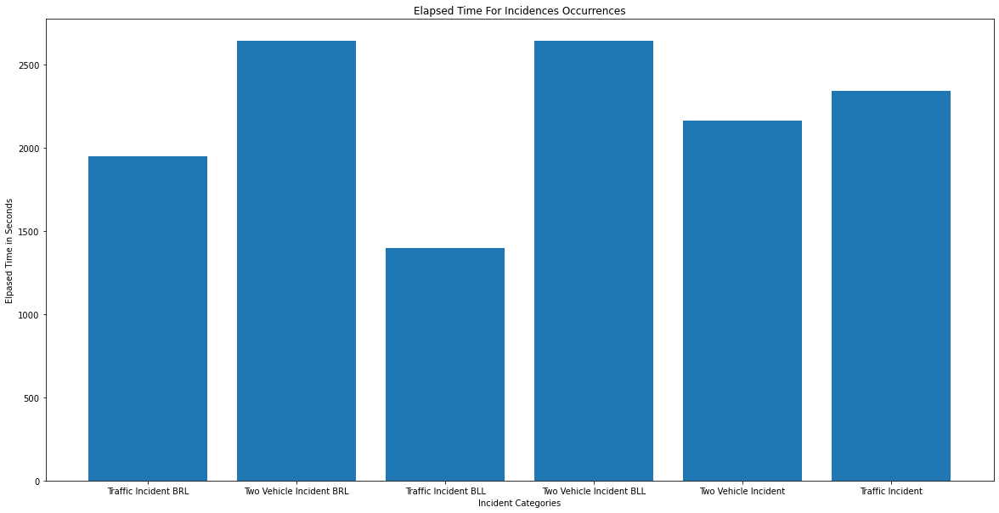

In [11]:

print("Part 4: 2021")

df = pd.read_csv('Traffic_Incidents.csv', delimiter = ',') #Import the traffice incidences .csv file and separate with ','

start_date = "2021-01-01"
end_date = "2021-12-31"

after_start_date = df["START_DT"] >= start_date
before_end_date = df["START_DT"] <= end_date
between_two_dates = after_start_date & before_end_date
df = df.loc[between_two_dates]
df = df.dropna()

df = [list(row) for row in df.values] #Use list comprehension to help with reading lines of the .csv file

def avg_single(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Traffic incident.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_single = avg_single(df)
list_single_avg = (sum(list_single)/len(list_single))

def avg_multi(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Traffic incident. Blocking the right lane.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_multi = avg_multi(df)
list_multi_avg = (sum(list_multi)/len(list_multi))

def avg_two(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Two vehicle incident. Blocking the right lane.' or '2 vehicle incident. Blocking the right lane.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_two = avg_two(df)
list_two_avg = (sum(list_two)/len(list_two))

def avg_t(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Traffic incident. Blocking the left lane.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_t = avg_t(df)
list_t_avg = (sum(list_t)/len(list_t))

def avg_p(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Two vehicle incident. Blocking the left lane.' or '2 vehicle incident. Blocking the left lane.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_p = avg_p(df)
list_p_avg = (sum(list_p)/len(list_p))

def avg_s(df):
    final_list = [] #Create two empty lists
    start_list = []
    for i in range(len(df)): #For the length of the first 5 rows in the dataset
        if 'Two vehicle incident.' in df[i][1]:
            start_time = df[i][2] #Take the start time and store it into a variable
            end_time = df[i][3] #Take the end time and store it into a variable
            time_1 = datetime.strptime(start_time, '%Y-%m-%d %H:%M') #Convert both variables to only contain the time
            time_2 = datetime.strptime(end_time, '%Y-%m-%d %H:%M')
            time_3 = time_2 - time_1 #Find the elapsed time
            time_4 = time_3.total_seconds() #Convert minutes to seconds
            final_list.append(time_4) #Append both the start time and converted minutes to seconds to the empty lists
    return final_list

list_s = avg_s(df)
list_s_avg = (sum(list_s)/len(list_s))

start_list = []
start_list.append(list_multi_avg)
start_list.append(list_two_avg)
start_list.append(list_t_avg)
start_list.append(list_p_avg)
start_list.append(list_s_avg)
start_list.append(list_single_avg)

final_list = []
final_list.append('Traffic Incident BRL')
final_list.append('Two Vehicle Incident BRL')
final_list.append('Traffic Incident BLL')
final_list.append('Two Vehicle Incident BLL')
final_list.append('Two Vehicle Incident')
final_list.append('Traffic Incident')
print(start_list)

#plt.rc('font', size=32) #Font and size of the lettering of the graph
fig, ax = plt.subplots(figsize=(20, 10)) #Create 1 plot within the mentioned size of the figure

# Specify how our lines should look
ax.bar(final_list, start_list, label='Elapsed Time') #Create a time series with the start times and elapsed times, the line should be the color orange and give it appropriate labels for the legend 

# Same as above
ax.set_xlabel('Incident Categories') #X axis label
ax.set_ylabel('Elpased Time in Seconds') #Y axis label
ax.set_title('Elapsed Time For Incidences Occurrences') #Figure title
#ax.grid(True) #Grid lines
# ax.legend(loc='upper left') #Create legend
plt.show() #Show graph

# Question 2 Insights, part B 

Pre-pandemic yearly trends (2017 - 2019):

   In 2017 <br>
   <br>
    * Two vehicle (blocked right lane); longest (7.5 minutes) <br>
    <br>
    * Multi-vehicle incidences; 2nd longest (6 minutes) <br>
    <br>
    * Two vehicle incidences; 3rd longest (5.5 minutes) <br>
    <br>
    * Single vehicle incidences; 4th longest (5 minutes) <br>
    <br>
    * Pedestrian incidences; 5th longest (5 minutes) <br>
    <br>
    * Traffic signal incidences; 6th longest (4 minutes, 55 seconds) <br>
    <br>
    
   In 2018 <br>
   <br>
    * Multi-vehicle incidences; longest (39 minutes) <br>
    <br>
    * Pedestrian incidences; 2nd longest (35 minutes) <br>
    <br>
    * Traffic signal incidences; 3rd longest (35 minutes) <br>
    <br>
    * Single vehicle incidences; 4th longest (33.5 minutes) <br>
    <br>
    * Two vehicle incidences; 5th longest (31.5 minutes) <br>
    <br>
    * Two vehicle incidences (blocked right lane); 6th longest (28.5 minutes) <br>
    <br>
    
   In 2019 <br>
   <br>
    * Multi-vehicle incidences; longest (45.5 minutes) <br>
    <br>
    * Pedestrian incidences; 2nd longest (40.5 minutes) <br>
    <br>
    * Single vehicle incidences; 3rd longest (39 minutes) <br>
    <br>
    * Two vehicle incidences; 4th longest (38 minutes) <br>
    <br>
    * Two vehicle incidences (blocked right lane); 5th longest (35 minutes) <br>
    <br>
    * Two vehicle incidences (blocked left lane); 6th longest (22 minutes) <br>
    <br>

Pandemic yearly trends (2021):

   In 2021 <br>
   <br>
    * Two vehicle incident (blocked right lane); longest (44 minutes) <br>
    <br>
    * Two vehicle incident (blocked left lane); 2nd longest (44 minutes) <br>
    <br>
    * Traffic incidences; 3rd longest (39 minutes) <br>
    <br>
    * Two vehicle incidences; 4th longest (36 minutes) <br>
    <br>
    * Traffic incidences (blocked right lane); 5th longest (32 minutes) <br>
    <br>
    * Traffic incidences (blocked left lane); 6th longest (23 minutes) <br>
    <br>

Conclusions: <br>
<br>
The main aid that these findings provide for ordinary citizens include both the severity of the incident and the congestion times found within the roads/highways/avenues in which these incidences occur. We can see that within each year as the elapsed time for each incidence increases so does the implied severity of the incident. The severity and the elapsed time thereof when coupled with our geographical graphs can help citizens navigate through Calgary's most congested roads throughout the seasons in which the aforementioned incidences are most prevalent. This can help to decrease the congestion of roads whilst simultaneously providing alternative routes citizens can take to help maximize their safety when driving in harsh road conditions. 

# Section 4

This section is by Josh Fisher

<font size="5">**Weather Analysis**</font> <br/>
<br/>
<font size="2">***&nbsp;&nbsp;&nbsp;&nbsp;In this section, we will be exploring the impact of weather on our observed traffic incidents, with our aim of initiating a more thorough understanding of the contributory factors that lead to either an influx, or reduction in recorded traffic incidents in the Calgary Metropolitan Region.***</font> <br/>
<br/>
&nbsp;&nbsp;&nbsp;&nbsp; Our analysis of weather has brought another datset into our work, coming from an archived weather collection through the Government of Canada. The datset has been imported to include the entirety of 2021, as aside from an abnormal heat spell in July through to August, we have observed a pattern congruent to Calgary's historical normality. Additionaly, we observe a slightly colder than traditional February, which will aid in assessing the impact of inclement winter weather. 


Below, we can observe our 2021 temperature data, in comparison to the historic averages:
    

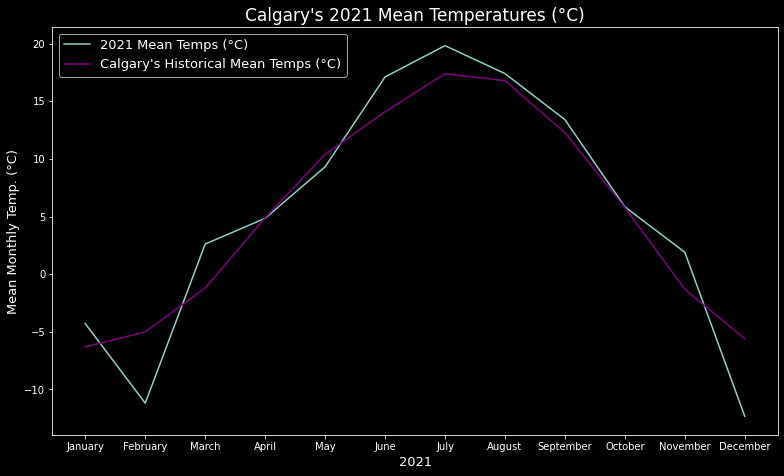

In [12]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

data=pd.read_csv('Weather.csv')
df=pd.DataFrame(data)

calgary_normal_mean_temps = [-6.3,-5,-1.2,4.9,10.4,14.1,17.4,16.8,12.3,5.8,-1.3,-5.6] # Climate-Data.org (Calgary climate)
mean_temp = df["Mean Temp (°C)"]
monthly_means_2021 = [np.mean(mean_temp[0:31]),np.mean(mean_temp[31:59]),np.mean(mean_temp[59:90]),np.mean(mean_temp[90:120]),np.mean(mean_temp[120:151]),np.mean(mean_temp[151:181]),np.mean(mean_temp[181:212]),np.mean(mean_temp[212:243]),np.mean(mean_temp[243:273]),np.mean(mean_temp[273:304]),np.mean(mean_temp[304:334]),np.mean(mean_temp[334:365])] 
months = ["January", "February", "March", "April","May","June", "July","August", "September", "October", "November", "December"]
# Our "Calgary Normal Mean Temps" have been manually entered into our list, as 12 data points did not warrant importing a dataset.

plt.style.use('dark_background')
fig = plt.figure()
plt.xlabel('2021',fontsize=13)
plt.ylabel('Mean Monthly Temp. (°C)',fontsize=13)
plt.plot(months,monthly_means_2021,label = "2021 Mean Temps (°C)")
plt.plot(months,calgary_normal_mean_temps,label = "Calgary's Historical Mean Temps (°C)", color = "purple")
plt.title("Calgary's 2021 Mean Temperatures (°C)", fontsize=17)
plt.legend(loc='upper left',fontsize = 13, markerscale = 10) 
fig.set_size_inches(13,7.5)
plt.show()

&nbsp;&nbsp;&nbsp;&nbsp;This plot suggests our 2021 weather data is indeed a strong candidate for further exploration. For simplifying our further analysis, we have assigned values to multiple different weather related variables below, to eliminate the need for slicing on the go while creating visualizations. Rather, we have named variables to use. 

In [13]:
date = df["Date/Time"]
max_temp = df["Max Temp (°C)"]
precip = df["Total Precip (mm)"]
max_wind = df["Spd of Max Gust (km/h)"]
mean_temp = df["Mean Temp (°C)"]
min_temp = df["Min Temp (°C)"]
snowfall = df["Total Snow (cm)"]
snow_on_ground = df["Snow on Grnd (cm)"]
min_temp = df["Min Temp (°C)"]

# In our earlier analysis, we have generated the daily count of incidents throughout 2021, found in our incident list below. 

incidents = [7, 9, 4, 17, 18, 18, 14, 17, 7, 6, 14, 15, 18, 12, 25, 9, 6, 20, 11, 17, 15, 15, 7, 5, 6, 20, 32, 10, 20, 11, 8, 18, 22, 48, 16, 55, 34, 30, 44, 33, 34, 26, 27, 21, 12, 7, 30, 36, 22, 15, 7, 4, 26, 20, 17, 13, 18, 8, 12, 13, 20, 17, 15, 20, 10, 7, 6, 9, 15, 14, 12, 12, 8, 18, 16, 29, 16, 18, 10, 5, 13, 7, 8, 27, 8, 9, 4, 15, 18, 15, 16, 14, 12, 8, 17, 15, 7, 15, 14, 8, 11, 18, 14, 14, 26, 15, 8, 9, 8, 15, 23, 15, 8, 9, 3, 7, 17, 30, 18, 18, 12, 8, 19, 12, 16, 13, 8, 14, 4, 24, 11, 14, 7, 24, 8, 6, 11, 10, 9, 12, 16, 12, 6, 10, 14, 17, 20, 14, 18, 12, 16, 14, 24, 26, 20, 9, 9, 11, 13, 14, 17, 16, 16, 19, 14, 23, 32, 25, 28, 14, 13, 17, 23, 17, 21, 28, 15, 15, 20, 20, 32, 10, 25, 11, 15, 25, 17, 33, 25, 32, 15, 8, 26, 25, 23, 23, 23, 16, 10, 19, 21, 27, 16, 27, 17, 6, 20, 19, 20, 15, 22, 10, 16, 10, 19, 16, 19, 23, 5, 13, 24, 25, 25, 22, 27, 16, 7, 25, 17, 25, 21, 27, 22, 14, 27, 20, 24, 26, 11, 18, 13, 18, 28, 24, 18, 14, 16, 23, 16, 27, 26, 15, 19, 13, 10, 21, 20, 20, 26, 15, 17, 12, 23, 26, 36, 37, 20, 20, 12, 17, 21, 46, 26, 27, 14, 15, 18, 22, 26, 26, 30, 17, 10, 7, 22, 18, 17, 19, 28, 7, 15, 21, 21, 26, 11, 32, 16, 18, 29, 24, 26, 29, 27, 20, 19, 28, 26, 22, 30, 21, 8, 31, 24, 30, 19, 31, 18, 6, 19, 18, 29, 24, 38, 14, 11, 34, 27, 31, 27, 23, 32, 18, 16, 21, 21, 18, 30, 24, 19, 40, 35, 32, 22, 31, 25, 12, 32, 40, 46, 56, 66, 21, 13, 48, 24, 25, 28, 51, 9, 33, 32, 40, 31, 35, 22]

JanuaryIncidents=(incidents[0:31])
JanuaryDate = date[0:31]
JanuaryMeanTempDaily = mean_temp[0:31]
JanuaryMeanTempMonthly = np.mean(JanuaryMeanTempDaily)
JanuaryPrecip = precip[0:31]
JanuarySumPrecip = np.sum(JanuaryPrecip)
JanauryMaxWindGustDaily = max_wind[0:31]
JanuaryMeanMaxWindGust = np.mean(JanauryMaxWindGustDaily)
JanuarySnowDaily = snowfall[0:31]
JanuaryMeanSnow = np.mean(JanuarySnowDaily)
JanuarySnowOnGroundDaily = snow_on_ground[0:31]
JanuarySnowOnGroundMean = np.mean(JanuarySnowOnGroundDaily)

FebruaryIncidents = (incidents[31:59])
FebruaryDate = date[31:59]
FebruaryMeanTempDaily = mean_temp[31:59]
FebruaryMeanTempMonthly = np.mean(FebruaryMeanTempDaily)
FebruaryPrecip = precip[31:59]
FebruarySumPrecip = np.sum(FebruaryPrecip)
FebruaryMaxWindGustDaily = max_wind[31:59]
FebruaryMeanMaxWindGust = np.mean(FebruaryMaxWindGustDaily)
FebruarySnowDaily = snowfall[31:59]
FebruaryMeanSnow = np.mean(FebruarySnowDaily)
FebruarySnowOnGroundDaily = snow_on_ground[31:59]
FebruarySnowOnGroundMean = np.mean(FebruarySnowOnGroundDaily)

MarchIncidents = (incidents[59:90])
MarchDate = date[59:90]
MarchMeanTempDaily = mean_temp[59:90]
MarchMeanTempMonthly=np.mean(MarchMeanTempDaily)
MarchPrecip = precip[59:90]
MarchSumPrecip = np.sum(MarchPrecip)
MarchMaxWindGustDaily = max_wind[59:90]
MarchMeanMaxWindGust = np.mean(MarchMaxWindGustDaily)
MarchSnowDaily = snowfall[59:90]
MarchMeanSnow = np.mean(MarchSnowDaily)
MarchSnowOnGroundDaily = snow_on_ground[59:90]
MarchSnowOnGroundMean = np.mean(MarchSnowOnGroundDaily)

AprilIncidents = (incidents[90:120])
AprilDate = date[90:120]
AprilMeanTempDaily = mean_temp[90:120]
AprilMeanTempMonthly = np.mean(AprilMeanTempDaily)
AprilPrecip = precip[90:120]
AprilSumPrecip = np.sum(AprilPrecip)
AprilMaxWindGustDaily = max_wind[90:120]
AprilMeanMaxWindGust = np.mean(AprilMaxWindGustDaily)
AprilSnowDaily = snowfall[90:120]
AprilMeanSnow = np.mean(AprilSnowDaily)
AprilSnowOnGroundDaily = snow_on_ground[90:120]
AprilSnowOnGroundMean = np.mean(AprilSnowOnGroundDaily)

MayIncidents = (incidents[120:151])
MayDate = date[120:151]
MayMeanTempDaily = mean_temp[120:151]
MayMeanTempMonthly = np.mean(AprilMeanTempDaily)
MayPrecip = precip[120:151]
MaySumPrecip = np.sum(MayPrecip)
MayMaxWindGustDaily = max_wind[120:151]
MayMeanMaxWindGust = np.mean(MayMaxWindGustDaily)
MaySnowDaily = snowfall[120:151]
MayMeanSnow = np.mean(MaySnowDaily)
MaySnowOnGroundDaily = snow_on_ground[120:151]
MaySnowOnGroundMean = np.mean(MaySnowOnGroundDaily)

JuneIncidents = (incidents[151:181])
JuneDate = date[151:181]
JuneMeanTempDaily = mean_temp[151:181]
JuneMeanTempMonthly = np.mean(JuneMeanTempDaily)
JunePrecip = precip[151:181]
JuneSumPrecip = np.sum(JunePrecip)
JuneMaxWindGustDaily = max_wind[151:181]
JuneMeanMaxWindGust = np.mean(JuneMaxWindGustDaily)
JuneSnowDaily = snowfall[151:181]
JuneMeanSnow = np.mean(JuneSnowDaily)
JuneSnowOnGroundDaily = snow_on_ground[151:181]
JuneSnowOnGroundMean = np.mean(JuneSnowOnGroundDaily)

JulyIncidents = (incidents[181:212])
JulyDate = date[181:212]
JulyMeanTempDaily = mean_temp[181:212]
JulyMeanTempMonthly = np.mean(JulyMeanTempDaily)
JulyPrecip = precip[181:212]
JulySumPrecip = np.sum(JulyPrecip)
JulyMaxWindGustDaily = max_wind[181:212]
JulyMeanMaxWindGust = np.mean(JulyMaxWindGustDaily)
JulySnowDaily = snowfall[181:212]
JulyMeanSnow = np.mean(JulySnowDaily)
JulySnowOnGroundDaily = snow_on_ground[181:212]
JulySnowOnGroundMean = np.mean(JulySnowOnGroundDaily)

AugustIncidents = (incidents[212:243])
AugustDate = date[212:243]
AugustMeanTempDaily = mean_temp[212:243]
AugustMeanTempMonthly = np.mean(AugustMeanTempDaily)
AugustPrecip = precip[212:243]
AugustSumPrecip = np.sum(AugustPrecip)
AugustMaxWindGustDaily = max_wind[212:243]
AugustMeanMaxWindGust = np.mean(AugustMaxWindGustDaily)
AugustSnowDaily = snowfall[212:243]
AugustMeanSnow = np.mean(AugustSnowDaily)
AugustSnowOnGroundDaily = snow_on_ground[212:243]
AugustSnowOnGroundMean = np.mean(AugustSnowOnGroundDaily)

SeptemberIncidents = (incidents[243:273])
SeptemberDate = date[243:273]
SeptemberMeanTempDaily = mean_temp[243:273]
SeptemberMeanTempMonthly = np.mean(SeptemberMeanTempDaily)
SeptemberPrecip = precip[243:273]
SeptemberSumPrecip = np.sum(FebruaryPrecip)
SeptemberMaxWindGustDaily = max_wind[243:273]
SeptemberMeanMaxWindGust = np.mean(SeptemberMaxWindGustDaily)
SeptemberSnowDaily = snowfall[243:273]
SeptemberMeanSnow = np.mean(SeptemberSnowDaily)
SeptemberSnowOnGroundDaily = snow_on_ground[243:273]
SeptemberSnowOnGroundMean = np.mean(SeptemberSnowOnGroundDaily)

OctoberIncidents = (incidents[273:304])
OctoberDate = date[273:304]
OctoberMeanTempDaily = mean_temp[273:304]
OctoberMeanTempMonthly = np.mean(OctoberMeanTempDaily)
OctoberPrecip = precip[273:304]
OctoberSumPrecip = np.sum(OctoberPrecip)
OctoberMaxWindGustDaily = max_wind[273:304]
OctoberMeanMaxWindGust = np.mean(OctoberMaxWindGustDaily)
OctoberSnowDaily = snowfall[273:304]
OctoberMeanSnow = np.mean(OctoberSnowDaily)
OctoberSnowOnGroundDaily = snow_on_ground[273:304]
OctoberSnowOnGroundMean = np.mean(OctoberSnowOnGroundDaily)

NovemberIncidents = (incidents[304:334])
NovemberDate = date[304:334]
NovemberMeanTempDaily = mean_temp[304:334]
NovemberMeanTempMonthly = np.mean(NovemberMeanTempDaily)
NovemberPrecip = precip[304:334]
NovemberSumPrecip = np.sum(NovemberPrecip)
NovemberMaxWindGustDaily = max_wind[304:334]
NovemberMeanMaxWindGust = np.mean(NovemberMaxWindGustDaily)
NovemberSnowDaily = snowfall[304:334]
NovemberMeanSnow = np.mean(NovemberSnowDaily)
NovemberSnowOnGroundDaily = snow_on_ground[304:334]
NovemberSnowOnGroundMean = np.mean(NovemberSnowOnGroundDaily)

DecemberIncidents = (incidents[334:365])
DecemberDate = date[334:365]
DecemberMeanTempDaily = mean_temp[334:365]
DecemberMeanTempMonthly = np.mean(DecemberMeanTempDaily)
DecemberPrecip = precip[334:365]
DecemberSumPrecip = np.sum(DecemberPrecip)
DecemberMaxWindGustDaily = max_wind[334:365]
DecemberMeanMaxWindGust = np.mean(DecemberMaxWindGustDaily)
DecemberSnowDaily = snowfall[334:365]
DecemberMeanSnow = np.mean(DecemberSnowDaily)
DecemberSnowOnGroundDaily = snow_on_ground[334:365]
DecemberSnowOnGroundMean = np.mean(DecemberSnowOnGroundDaily)

<font size="3">**Seasonality of YYC Traffic Incidents: Exploring the Climate's Effect**</font> <br/>
<br/>
&nbsp;&nbsp;&nbsp;&nbsp; As we previously have identified, traffic incidents in the Calgary Metrolpolitan Region vary from month to month. It is worth while to explore the broad trend of these occurences, in relation to the incurred change in temperature, before exploring the variables that plausibly will have a more profound and direct correlation during their occurence. Below, we can see the relationship between monthly average temperature, and the corresponding traffic incidents. From this, we can identify one significant trend - Our winter months appear to correspond to higher incident counts, and in particular we notice a spike in incidents in February, when we observe a sharp decrease in temperature. We will explore this further below:


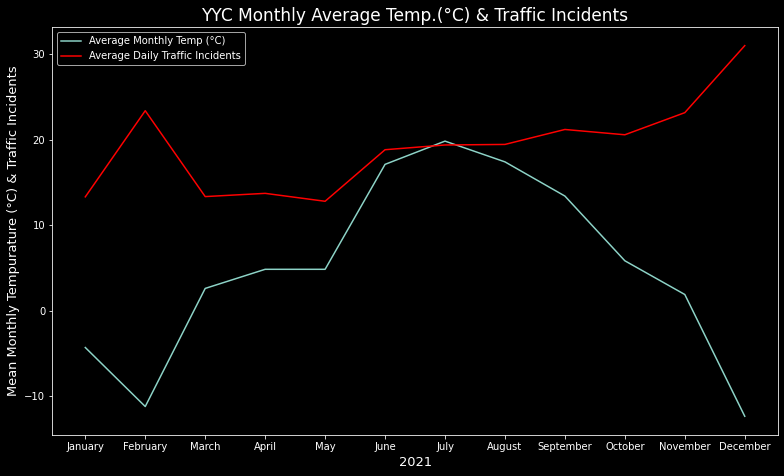

In [14]:
mean_monthly_temp = [JanuaryMeanTempMonthly, FebruaryMeanTempMonthly, MarchMeanTempMonthly, AprilMeanTempMonthly,MayMeanTempMonthly,JuneMeanTempMonthly,JulyMeanTempMonthly,AugustMeanTempMonthly,SeptemberMeanTempMonthly,OctoberMeanTempMonthly,NovemberMeanTempMonthly,DecemberMeanTempMonthly]              
mean_monthly_incidents= [np.mean(JanuaryIncidents), np.mean(FebruaryIncidents), np.mean(MarchIncidents), np.mean(AprilIncidents), np.mean(MayIncidents), np.mean(JuneIncidents), np.mean(JulyIncidents), np.mean(AugustIncidents), np.mean(SeptemberIncidents), np.mean(OctoberIncidents), np.mean(NovemberIncidents), np.mean(DecemberIncidents)]


plt.style.use('dark_background')
fig = plt.figure()
plt.xlabel('2021',fontsize=13)
plt.ylabel('Mean Monthly Tempurature (°C) & Traffic Incidents',fontsize=13)
plt.plot(months,mean_monthly_temp,label = "Average Monthly Temp (°C)")
plt.plot(months,mean_monthly_incidents,label = "Average Daily Traffic Incidents", color = "red")
plt.title("YYC Monthly Average Temp.(°C) & Traffic Incidents",fontsize=17)
plt.legend(loc='upper left',fontsize = 10, markerscale = 10) 
fig.set_size_inches(13,7.5)
plt.show()

<font size="3">**Seasonality of YYC Traffic Incidents: Exploring the Climate's Effect (Con't)**</font> <br/>
<br/>
&nbsp;&nbsp;&nbsp;&nbsp;Our above graph is indicative of there being an influence on traffic incident count, driven by the temperature. However, to better understand this we need to explore more variables that contribute to the overal climate. Below, we will have a look at the influence of snow, precipitation, and wind on our observed traffic incidents. 

<font size="3">**&nbsp;&nbsp;&nbsp;&nbsp;Snowfall & Snow on the Ground:**</font> <br/>
- For our snowfall and snow on the ground analysis, we have opted to use January and February as our sample.

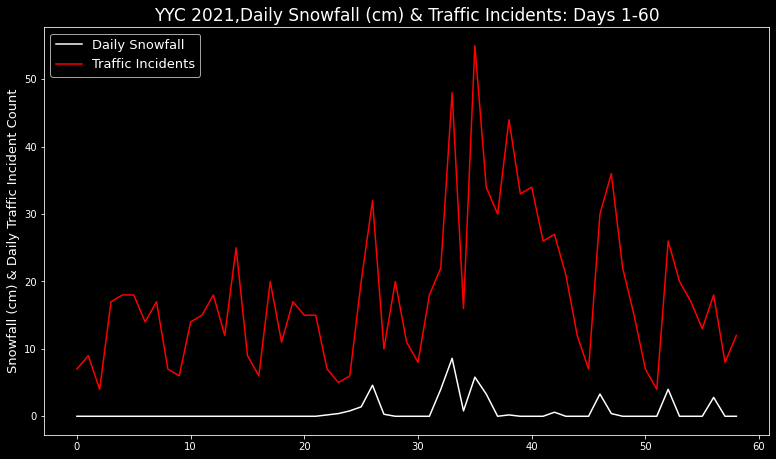

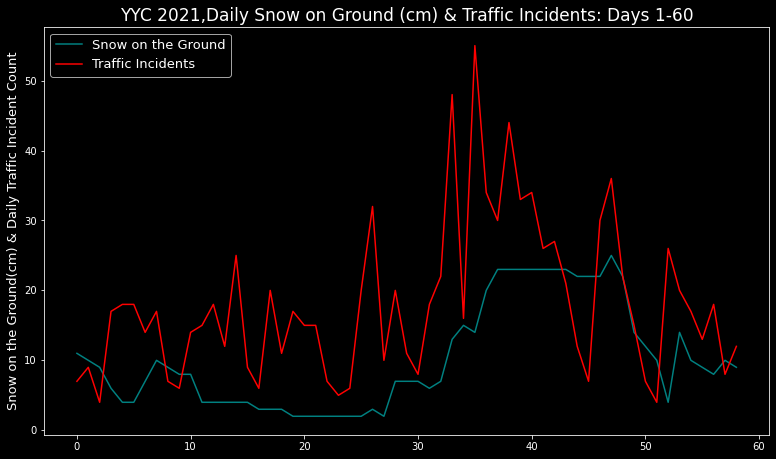

In [15]:
fig = plt.figure()
plt.xlabel('')
plt.ylabel('Snowfall (cm) & Daily Traffic Incident Count',fontsize=13)
plt.plot(np.arange(59), snowfall[0:59],label = "Daily Snowfall",color='white')
plt.plot(np.arange(59), incidents[0:59],label = "Traffic Incidents", color = 'red')
plt.title("YYC 2021,Daily Snowfall (cm) & Traffic Incidents: Days 1-60",fontsize=17)
plt.legend(loc='upper left',fontsize = 13, markerscale = 10) 
fig.set_size_inches(13,7.5)
plt.show()

fig = plt.figure()
plt.xlabel('')
plt.ylabel('Snow on the Ground(cm) & Daily Traffic Incident Count',fontsize=13)
plt.plot(np.arange(59), snow_on_ground[0:59],label = "Snow on the Ground",color='teal')
plt.plot(np.arange(59), incidents[0:59],label = "Traffic Incidents", color = 'red')
plt.title("YYC 2021,Daily Snow on Ground (cm) & Traffic Incidents: Days 1-60",fontsize=17)
plt.legend(loc='upper left',fontsize = 13, markerscale = 10) 
fig.set_size_inches(13,7.5)
plt.show()

<font size="3">**&nbsp;&nbsp;&nbsp;&nbsp;Precipitation:**</font> <br/>
- First, we will have a look at the entirety of 2021, and the daily precipiaition. However, this leaves us without much value, so we will have a further look into the months in which precipitation is noticeably higher than other.

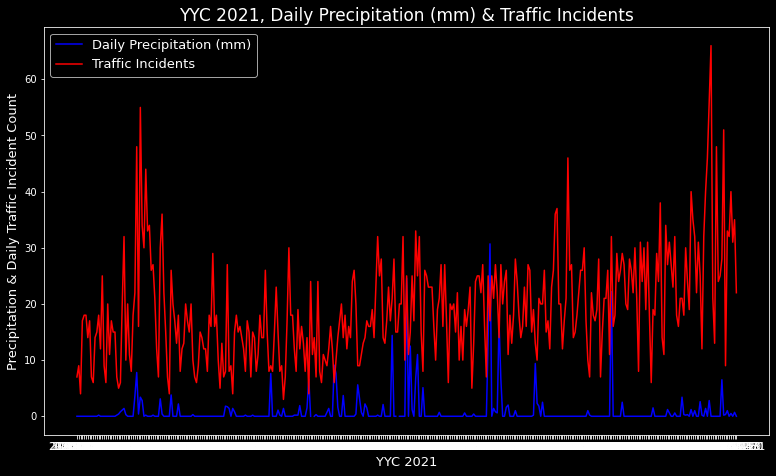

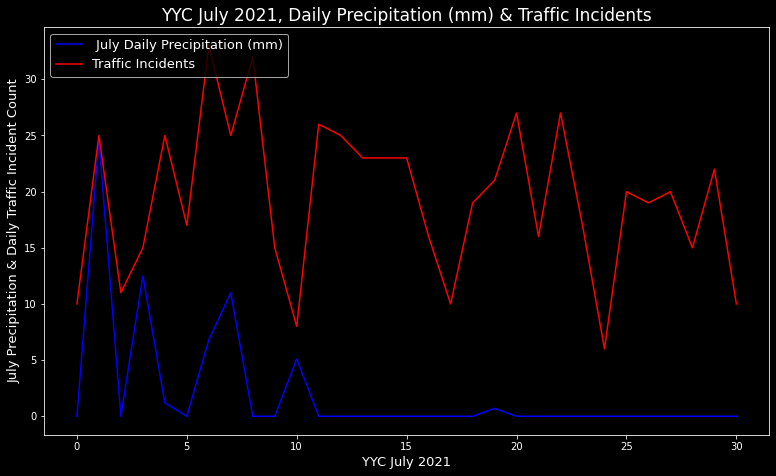

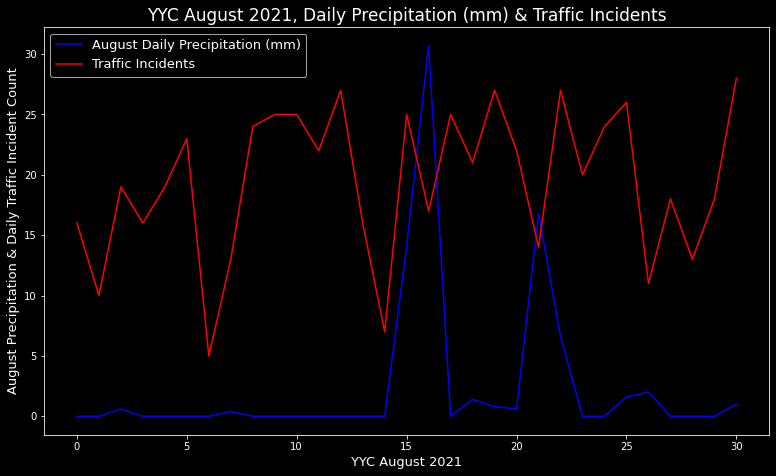

In [16]:
fig = plt.figure()
plt.xlabel('YYC 2021',fontsize=13)
plt.ylabel('Precipitation & Daily Traffic Incident Count',fontsize=13)
plt.plot(date, precip,label = "Daily Precipitation (mm)",color='blue')
plt.plot(date, incidents,label = "Traffic Incidents", color = 'red')
plt.title("YYC 2021, Daily Precipitation (mm) & Traffic Incidents",fontsize=17)
plt.legend(loc='upper left',fontsize = 13, markerscale = 10) 
fig.set_size_inches(13,7.5)
plt.show()


fig = plt.figure()
plt.xlabel('YYC July 2021',fontsize=13)
plt.ylabel('July Precipitation & Daily Traffic Incident Count',fontsize=13)
plt.plot(np.arange(31), JulyPrecip,label = " July Daily Precipitation (mm)",color='blue')
plt.plot(np.arange(31), JulyIncidents,label = "Traffic Incidents", color = 'red')
plt.title("YYC July 2021, Daily Precipitation (mm) & Traffic Incidents",fontsize=17)
plt.legend(loc='upper left',fontsize = 13, markerscale = 10) 
fig.set_size_inches(13,7.5)
plt.show()


fig = plt.figure()
plt.xlabel('YYC August 2021',fontsize=13)
plt.ylabel('August Precipitation & Daily Traffic Incident Count',fontsize=13)
plt.plot(np.arange(31), AugustPrecip,label = "August Daily Precipitation (mm)",color='blue')
plt.plot(np.arange(31), AugustIncidents,label = "Traffic Incidents", color = 'red')
plt.title("YYC August 2021, Daily Precipitation (mm) & Traffic Incidents",fontsize=17)
plt.legend(loc='upper left',fontsize = 13, markerscale = 10) 
fig.set_size_inches(13,7.5)
plt.show()

<font size="3">**&nbsp;&nbsp;&nbsp;&nbsp;Wind:**</font> <br/>
- Again, we will identify noticeable variablity in the yearly plot, and analyze particular months in attempt to reveal if wind may be a contributory factor in increased incident count. With our weather dataset, there was missing data for 'Max Wind Gusts'. We have chosen to leave these blank, rather than replace them with a value.

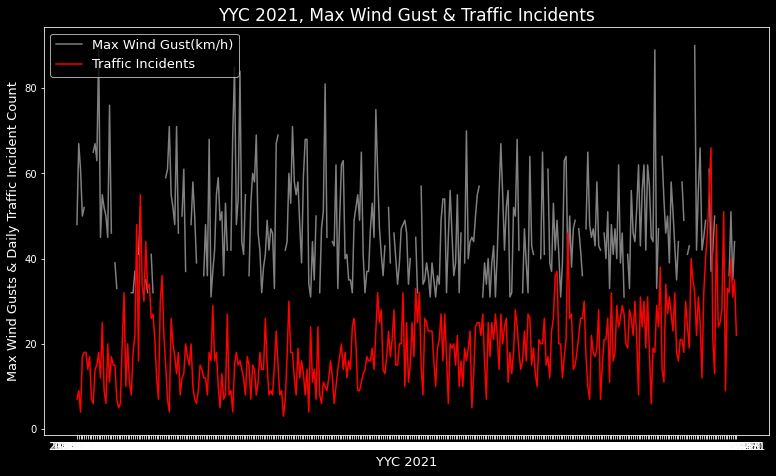

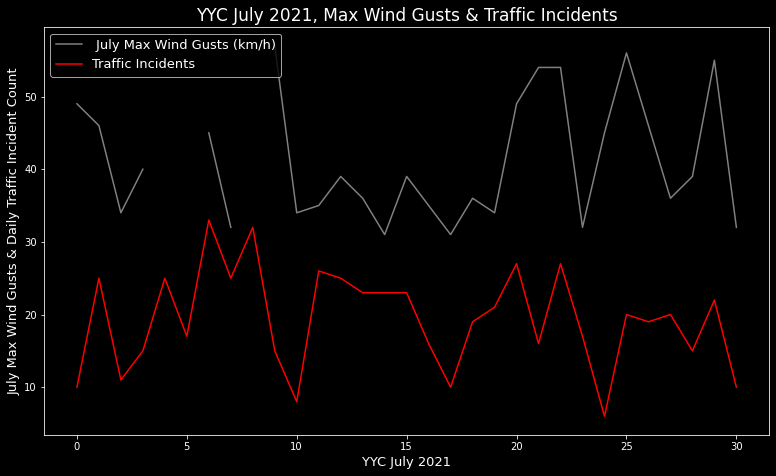

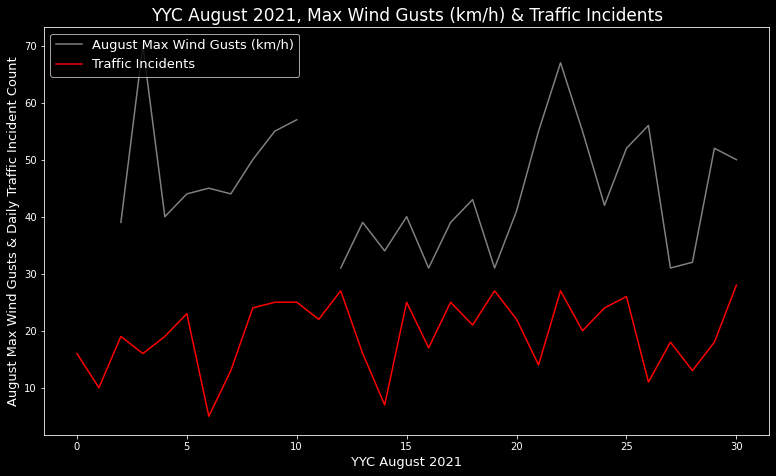

In [17]:
fig = plt.figure()
plt.xlabel('YYC 2021',fontsize=13)
plt.ylabel('Max Wind Gusts & Daily Traffic Incident Count',fontsize=13)
plt.plot(date, max_wind,label = "Max Wind Gust(km/h)",color='grey')
plt.plot(date, incidents,label = "Traffic Incidents", color = 'red')
plt.title("YYC 2021, Max Wind Gust & Traffic Incidents",fontsize=17)
plt.legend(loc='upper left',fontsize = 13, markerscale = 10) 
fig.set_size_inches(13,7.5)
plt.show()


fig = plt.figure()
plt.xlabel('YYC July 2021',fontsize=13)
plt.ylabel('July Max Wind Gusts & Daily Traffic Incident Count',fontsize=13)
plt.plot(np.arange(31), JulyMaxWindGustDaily,label = " July Max Wind Gusts (km/h)",color='grey')
plt.plot(np.arange(31), JulyIncidents,label = "Traffic Incidents", color = 'red')
plt.title("YYC July 2021, Max Wind Gusts & Traffic Incidents",fontsize=17)
plt.legend(loc='upper left',fontsize = 13, markerscale = 10) 
fig.set_size_inches(13,7.5)
plt.show()


fig = plt.figure()
plt.xlabel('YYC August 2021',fontsize=13)
plt.ylabel('August Max Wind Gusts & Daily Traffic Incident Count',fontsize=13)
plt.plot(np.arange(31), AugustMaxWindGustDaily,label = "August Max Wind Gusts (km/h)",color='grey')
plt.plot(np.arange(31), AugustIncidents,label = "Traffic Incidents", color = 'red')
plt.title("YYC August 2021, Max Wind Gusts (km/h) & Traffic Incidents",fontsize=17)
plt.legend(loc='upper left',fontsize = 13, markerscale = 10) 
fig.set_size_inches(13,7.5)
plt.show()

<font size="3">**Seasonality of YYC Traffic Incidents: Exploring the Climate's Effect (Con't)**</font> <br/>
<br/>
&nbsp;&nbsp;&nbsp;&nbsp; After exploring the impact of the different weather patterns we experience in Calgary, without using any statistical methods, can safely assume that weather is indeed a driving factor in our incident count. However, not all weather variables play a significant role. Looking above at the visualization, we can infer that wind does not appear to have a substantial impact on the number of incidents in our explored months - July and August. Similarily, summer precipitation also appears negligiable with repect to corresponding incident counts. Though one trend that is easily recognizable, is the impact that snowfall has on our incident rate. When we observe increased snowfall, our incidents follow. Yet we are left with snowless periods in our winter months, in which incidents counts are seemingly at an annual low. Between the period of January 1, 2021 - January 20, 2021 we did not experience any snowfall. What we did experience though, is temperatures below zero, and substantial amounts of snow on the ground:

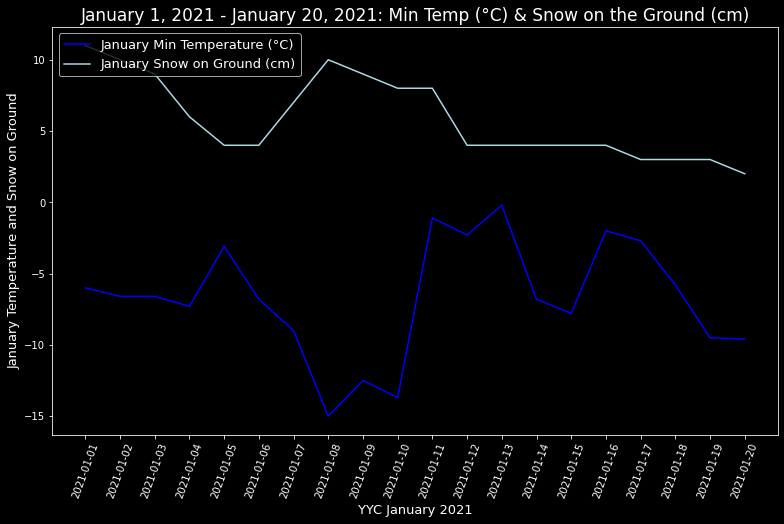

In [18]:
fig = plt.figure()
plt.xlabel('YYC January 2021',fontsize=13)
degrees = 70
plt.xticks(rotation=degrees)
plt.ylabel('January Temperature and Snow on Ground',fontsize=13)
plt.plot(np.arange(20), min_temp[0:20],label = "January Min Temperature (°C)",color='blue')
plt.plot(JanuaryDate[0:20], JanuarySnowOnGroundDaily[0:20],label = "January Snow on Ground (cm)", color = 'lightblue')
plt.title("January 1, 2021 - January 20, 2021: Min Temp (°C) & Snow on the Ground (cm)",fontsize=17)
plt.legend(loc='upper left',fontsize = 13, markerscale = 10) 
fig.set_size_inches(13,7.5)
plt.show()

Which leaves us to explain, "Why do we observe periods of less accidents with freezing temperatures and snow on the ground, opposed to warmer periods in which it would be safe to assume driving conditions would be more favorable? Our explanation is rooted in dilligence being practiced in winter months, with slower speeds aiding in the reduction of incidents, rather than a data driven metric. Below are the recorded traffic incidents for 3 different 20 days periods - our snowless January period, along with two periods of warmth in June and July. 

Recorded Incidents:


January Period: 13.285714285714286
June Period: 17.85
July Period: 19.387096774193548




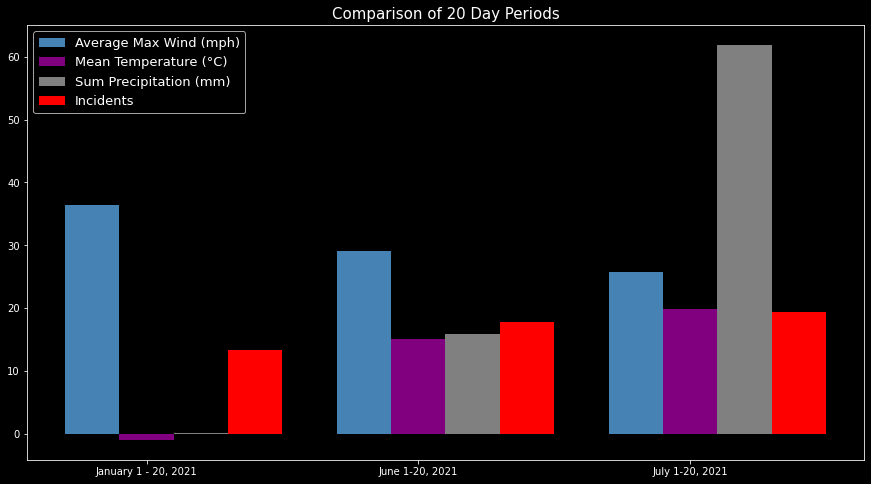

In [19]:
print("Recorded Incidents:")
print('\n')
print("January Period:",np.mean(incidents[0:21]))
print("June Period:",np.mean(incidents[151:171]))
print("July Period:",np.mean(incidents[181:212]))

Period = ['January 1 - 20, 2021','June 1-20, 2021','July 1-20, 2021']
Incidents = [5, 10, 15]
MeanTemp = [np.mean(mean_temp[0:21]), np.mean(mean_temp[151:171]), np.mean(mean_temp[181:212])]
MeanPrecipitation = [np.sum(precip[0:21]),np.sum(precip[151:171]),np.sum(precip[181:212])]
AverageMaxWindGust = [np.mean(max_wind[0:21])/1.6,np.mean(max_wind[151:171])/1.6,np.mean(max_wind[181:212])/1.6]
Incidents = [13.28,17.85,19.39]
print('\n')

x_axis = np.arange(len(Period))
plt.figure(figsize=(15,8))
plt.title("Comparison of 20 Day Periods", fontsize=15)
plt.bar(x_axis +0.20, AverageMaxWindGust, width=0.2, label = 'Average Max Wind (mph)', color ='steelblue')
plt.bar(x_axis +0.20*2, MeanTemp, width=0.2, label = 'Mean Temperature (°C)', color='purple')
plt.bar(x_axis +0.20*3, MeanPrecipitation, width=0.2, label = 'Sum Precipitation (mm)', color="grey")
plt.bar(x_axis +0.20*4, Incidents, width=0.2, label = 'Incidents', color="red")
plt.xticks(x_axis +0.4,Period)
plt.legend(fontsize=13)
plt.show()

<font size="3">**Geographical Analysis of Inclement Weather**</font> <br/>
 - So far through our analysis of weather, we have indentified that snowfall, rather than snow on ground, precipitation, or wind, is the biggest contributory factor in realizing increased incident rates. However, where are these increases occuring? Could they be mainly identified as an increase in freeway incidents, or potentially in specific communities? To find out, we will take a look below at the difference in location of observed incidents during periods of heavy snowfall, versus periods of minimal snow and precipitation. 
 
 - The code below was created by Connor Woods in Section 1. 


(-114.3097701, -113.8713622, 50.84874399, 51.19564827)


<Figure size 432x288 with 0 Axes>

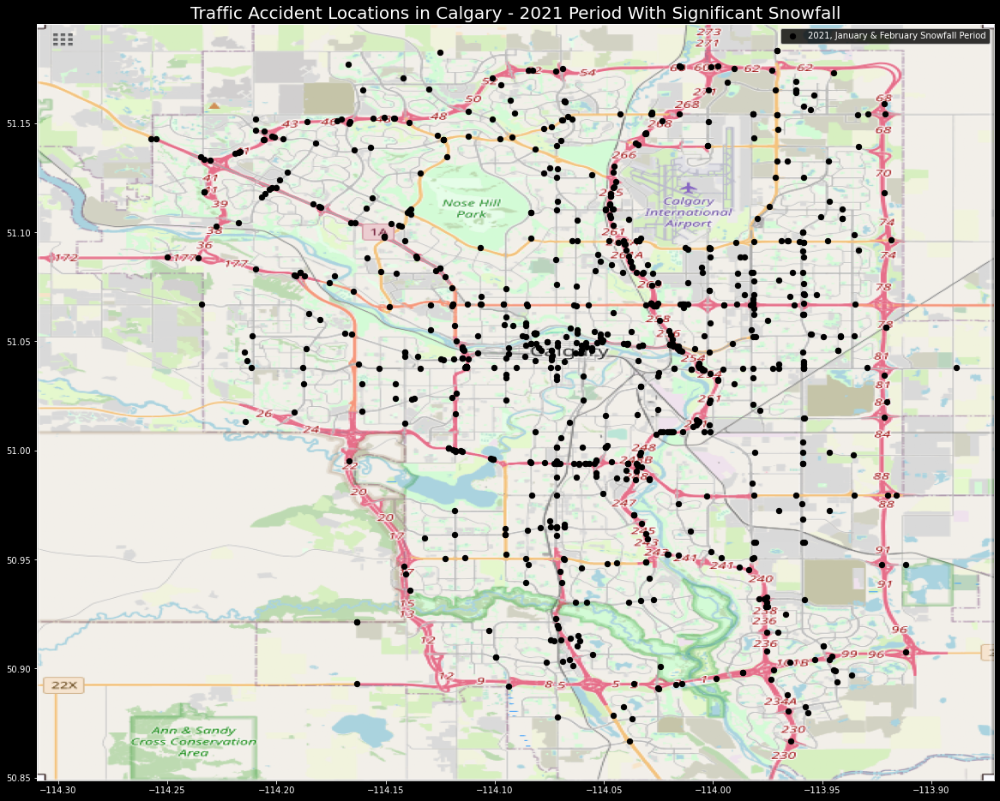

<Figure size 432x288 with 0 Axes>

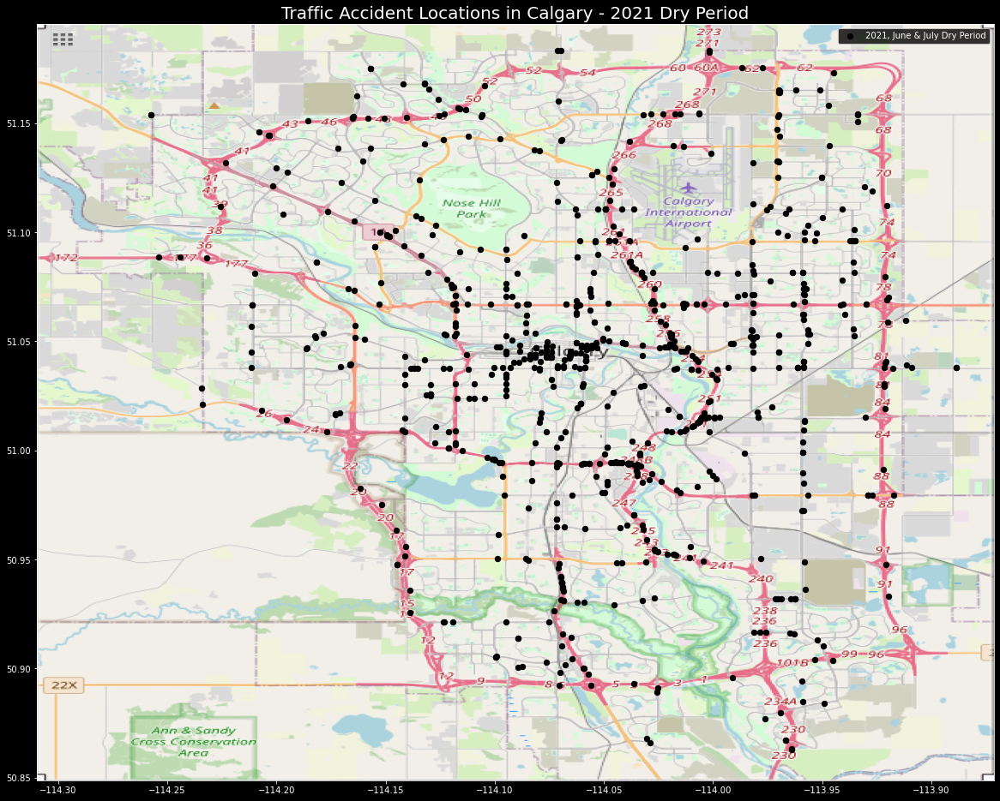

In [20]:
import pandas as pd
import matplotlib.pyplot as plt #Import matplotlib to help with creating a time series
import numpy as np
df = pd.read_csv('Traffic_Incidents.csv')
df = df[["START_DT","Longitude", "Latitude"]]

# drop (remove) rows with ambiguous latutude values.
df = df.drop(labels=[10702,21380], axis=0)

area = (df.Longitude.min(), df.Longitude.max(),      
         df.Latitude.min(), df.Latitude.max())
print(area)

latlong = []
periodSnow = {"2021-01-20":"2021-02-28","2021-06-21":"2021-08-00"}
for k,v in periodSnow.items():
    accidents = df.loc[(df.START_DT > k) & (df.START_DT < v)]
    latlong.append(accidents)

calgary = plt.imread('calgarymap.png')
SnowPeriod = plt.figure()
plt.figure(figsize=(20,28))
plt.imshow(calgary, zorder=0, extent = area, aspect= 'equal')
plt.title("Traffic Accident Locations in Calgary - 2021 Period With Significant Snowfall",fontsize=20)
plt.scatter(latlong[0].Longitude, latlong[0].Latitude, c='black', s=40)
plt.legend(["2021, January & February Snowfall Period"])


DryPeriod = plt.figure()
plt.figure(figsize=(20,28))
plt.scatter(latlong[1].Longitude, latlong[1].Latitude, c='black', s=40)
plt.imshow(calgary, zorder=0, extent = area, aspect= 'equal')
plt.title("Traffic Accident Locations in Calgary - 2021 Dry Period",fontsize=20)
plt.legend(["2021, June & July Dry Period"]) 

Our above plotting of the incident locations in both our heavy snowfall period, and our dry period, reveals that there is no major decernible change in incident location, except a slightly noticable increase in frequency in the NW quadrant of our city during our heavy snowfall sample, along with a slightly denser incident frequency in the downtown core during our dry period sample. Many variables may help to account for these discrepancies, to the likes of increased slope and grade changes on the roadways in the NW quandrant, leading to more incident prone conditions, and our dry period would assume a heavier flow of both vehiclar and foot traffic in the downtown core.   

<font size="3">**Insights: Impact of Weather**</font> <br/>
    
 - Broadly looking at an overlay of Calgary's incident count along with temperature data, would appear on the surface to reveal that periods of lower temperatures can drive incident rates upwards. However, our colder periods often incur the least amount of incidents while snowfall is absent. <br>
 <br>
 - Snowfall directly, and most impactfully corresponds to increased incidents observed in The Calgary Metropolitan Region. <br>
 <br>
 - Wind, Rainfall Precipitation, and Snow on the Ground, appear to have a negligible impact on observed incident rates within the city. <br>
 <br>
 - Winter months in which snowfall is not occuring, seemingly relate to our lowest incident rates. This may be attributed to personal driving patterns, and dilligence executed by drivers in winter months, and speed induced incidents in summer months while roads are more tailored to an influx in average speed amongst drivers, and increased vehicular and foot traffic.<br>
 <br>
 - Geographical plotting of incidents in snowy periods, versus dry periods suggests that incident location is not heavily impacted by climate, rather is follows a fairly normal distribution with repspect to traffic volume. 

# Discussion

    [1] Which days of the week are safest/more dangerous? How about months? When are the safest/most dangerous times to drive?

    [2] Has the number of traffic incidents changed since the start of the COVID pandemic?

    [3] What types of incidents are most frequent, and when? Which types last longest?

    [4] How does weather affect the number of observed accidents?
    
Question 1. A summary of our insights:
* October, November, and December are high risk months. Drive with caution during those months!
* July appears safer compared to other months. 
* Fridays have more accidents. Don’t regret rushing home to enjoy your weekend.
* Saturdays and Sundays seem like safer days to be on the road.
* Traffic accidents are more likely during conventional rush our times (8-10am, 3-5pm). Commute safely to and from work.
* Mid day drivers seem to be safer than other drivers. They are either more cautions, more attentive, less rushed, or other variables that can increase safety on the road.
<br>


Question 2. A summary of our insights
* Pre pandemic saw more accidents. We see a decrease in accidents post (during) pandemic across all city quadrants 
* The SE remains with the highest accident count pre/during pandemic, while NW remains the lowest
* Future analysis containing traffic volumes in each quadrant would be supplementary to our investigation.


Question 3. A summary of our insights:
* Comparatively from 2017 to 2021, the number of pedestrian incidences decreases, while most other categories increase. Less pedestrians is primarily due to the pandemic.
* We see higher incident times in multivehicle accidents, especially when lanes are blocked. This can be an indirect measure of severity of an incident. This category has increased over time, potentially indicating increasing severity.
* Future analysis on quadrant specific incidents will supplement our project.

Question 4. A summary of our insights:

- Cold weather can be attributed to increased incident count, howver it is only periods in which snow is falling that we see any significant contributory factor.
- Winter months in which snowfall is absent, tend to see our lowest incident rates. Regardless of snow being present on the ground.
- Other climate varables, such as wind and rainfall, play no significant role in increased observed traffic incidents. 
- Periods of snowfall, and periods of dry warmer weather don't deviate too far from each other
<br>

# Conclusion

Throughout the process of this project, the team has progressed in several ways. While we all polished up our python skills, we also gained valuable experience with pythonic libraries (pandas especially). The ability to creatively visualize data has also been a skill built from the ground up. Utilizing libraries like matlab, and plotly express, has been impactful, useful, and fun. While we learned some general coding skills, we also gained insights on our topic.

Our project produced some valuable insights onto traffic conditions, and best times to drive. While some conclusions may be more intuitive, others piqued interest, and are areas for further study. It was determined that certain months (Oct, Nov, Dec), and days of the week (Friday) appear more dangerous. Some safer times were also uncovered (July, and weekend driving). A temporal visualization gave interesting results, with mid day volumes being much higher than the overserved accidents. 
It was determined that the pandemic has resulted in an overall decrease in traffic incidents, but incorporating traffic volumes into this exploration wasn’t present, and would be an excellent point for further research.

The pandemic also resulted in lower incidents of pedestrian accidents, which is a likely result as lockdowns and quarantines force individuals to stay home. It was determined that certain accident types, especially multi vehicle ones with lane blockage, lasted longer, and may therefore be more severe. These incident types have increased in prevalence over the years, which may be a warning sign for Calgarian drivers.

Weather was found to have a slight impact on traffic incidents, particularly snowfall conditions. Other climate variables seemed to lack the impact that snowfall had on traffic incidents. Winter months with lack of snowfall saw a decrease in accidents.  

Combining these insights, we hope that you as a driver on Calgarian roads, stay informed, and drive cautiously during dangerous conditions and during dangerous traffic times.  


<br>

<font size="3">**References**</font> <br/>


AskPython (2022). How to update the value of a row in a Python Dataframe?. Retrieved February 3, 2022,https://www.askpython.com/python-modules/pandas/update-the-value-of-a-row-dataframe

Blog Finxter (2020). Python How to Join a List of Dictionaries into a Single One?. Retrieved February 3, 2022,https://blog.finxter.com/merge-dictionaries/

Calgary Climate: Average temperature, weather by month, Calgary weather avergaes. Climate-Data.org. Retrieved February 15, 2022 from https://en.climate-data.org/north-america/canada/alberta/calgary-390/

Car Accidents FAQ: How are Traffic Accidents Defined?: Morelli Law. Retrieved January 30, 2022 from https://www.morellilaw.com/faqs/what-is-the-definition-of-a-traffic-accident/

City of Calgary (2022). Open Government License – City of Calgary. Retrieved January 20, 2022. https://data.calgary.ca/stories/s/Open-Calgary-Terms-of-Use/u45n-7awa

City of Calgary (2022). Traffic counts at permanent stations. Retrieved February 6th, 2022. https://data.calgary.ca/Transportation-Transit/Traffic-Counts-at-Permanent-stations/vuyp-sbjb

GeeksForGeeks (2021). MatplotLib Pyplot. Retrieved February 3, 2022, https://www.geeksforgeeks.org/creating-pandas-dataframe-using-list-of-lists/

Kamran, K. (2022). DATA 601 Assignment #1. University of Calgary.

note.nkmk.me (2020). Get dictionary value from key with get() in Python. Retrieved February 3, 2022,https://note.nkmk.me/en/python-dict-get/

Potlygraphs. Subplots. 3 July 2019, https://plotly.com/python/subplots/.

Qassim, Ahmed. Easy Steps To Plot Geographical Data on a Map – Python. Towards Data Science. Retrieved January 20, 2022 from https://towardsdatascience.com/easy-steps-to-plot-geographic-data-on-a-map-python-11217859a2db

StackOverflow (2015).How to print rows if values appear in any column of pandas dataframe. Retrieved February 3, 2022, #https://stackoverflow.com/questions/24664913/how-to-print-rows-if-values-appear-in-any-column-of-pandas-dataframe

StackOverflow (2013). Renaming column names in Pandas. Retrieved February 3, 2022,https://stackoverflow.com/questions/11346283/renaming-column-names-in-pandas